# Analysis of inertial paticles in North Sea
In this notebook we analyse the trajectory of "stokes drifter" particles  
in the north sea and study the what the effect of including intertia is,   
i.e., advecting the particles with the MR equation vs advecting them with  
the background flow.   

In [3]:
# import needed packages
import numpy as np
import xarray as xr 
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.cm as cm
import cartopy.crs as ccrs #for plotting on map
import cartopy as cart
from decimal import Decimal
import plotly.express as px # for 3d plotting
from datetime import datetime, timedelta
from analysis_functions import trajectory_length,  make_PDF, Haversine, running_mean
import sys
sys.path.append("/nethome/4291387/Maxey_Riley_advection/Maxey_Riley_advection/simulations")
from helper import create_filelist

plt.style.use('../python_style_Meike.mplstyle')

Rearth = 6371 * 10**3 # in k
deg2rad = np.pi / 180.

#set directories and template filenames
base_directory = '/storage/shared/oceanparcels/output_data/data_Meike/MR_advection/NWES/'
basefile_MRSM = base_directory + 'inertial_SM/{loc}_start{y_s:04d}_{m_s:02d}_{d_s:02d}_end{y_e:04d}_{m_e:02d}_{d_e:02d}_RK4_B{B:04d}_tau{tau:04d}.zarr'
basefile_tracer = base_directory + 'tracer/{loc}_start{y_s:04d}_{m_s:02d}_{d_s:02d}_end{y_e:04d}_{m_e:02d}_{d_e:02d}_RK4.zarr'
# for fieldsets
field_directory = ('/storage/shared/oceanparcels/input_data/CMEMS/'
                   'NORTHWESTSHELF_ANALYSIS_FORECAST_PHY_004_013/')
input_filename_field_nologin = ('CMEMS_v6r1_NWS_PHY_NRT_NL_01hav3D_'
                                '{year_t:04d}{month_t:02d}{day_t:02d}_'
                                '{year_t:04d}{month_t:02d}{day_t:02d}_'
                                'R{year_tplus:04d}{month_tplus:02d}{day_tplus:02d}_HC01.nc')

input_filename_metoffice = ('metoffice_foam1_amm15_NWS_CUR_'
                            'b{year_t:04d}{month_tr:02d}{day_t:02d}_'
                            'hi{year_tplus:04d}{month_tplus:02d}{day_tplus:02d}.nc')



colorlist=np.array(['c','purple','orange','navy','red','black','green'])


In [41]:
# general settings
runtime =  timedelta(days=30)# timedelta(days=10)
loc = 'north-sea'
B = 0.7
tau = 2.7

starttimes=np.array([datetime(2023, 9, 1, 0, 0, 0, 0),
                      datetime(2023, 10, 1, 0, 0, 0, 0),
                      datetime(2023, 11, 1, 0, 0, 0, 0),
                      datetime(2023, 12, 1, 0, 0, 0, 0),
                      datetime(2024, 1, 1, 0, 0, 0, 0),
                      datetime(2024, 2, 1, 0, 0, 0, 0)])

date_new = datetime(2023, 9, 1, 0, 0, 0, 0)


## Eulerian analysis fieldsets
Below we investigate the Eulerian properties of the velocity fieldset used. That is:
- magnitude of spacial and temporal gradients in the velocity
- typical correlation length velocity  

With these values we can estimate if we expect an effect from Inertia or not

### Calculate and plot material derivatives fields
We import the fieldsets 1 month at a time (as is used in the simulations).  
Before 1/9/2023 we import the data from metuoffice uk, after 1/9/2023 we   
import data from nologin Spain.

In [44]:
# import data
starttime = starttimes[2]
print(starttime)
endtime = starttime + runtime
dt_field = timedelta(days=1)

if (starttime < date_new):
    input_filename =  input_filename_metoffice
    dt_name_field = timedelta(days=2)
else: 
    input_filename = input_filename_field_nologin
    dt_name_field = timedelta(days=1)

oceanfiles = create_filelist(field_directory, input_filename,
                               starttime, endtime, dt_field, dt_name_field)

dflow = xr.open_mfdataset(oceanfiles, drop_variables = ['thetao','so','depth'])
# only keep upper layer
dflow['uo'] = dflow['uo'][:,0,:,:]
dflow['vo'] = dflow['vo'][:,0,:,:]
dlon = (dflow['longitude'][1]-dflow['longitude'][0]).values
dlat = (dflow['latitude'][1]-dflow['latitude'][0]).values
dtime = (dflow['time'][1]-dflow['time'][0]).values

time, lon, lat = (dflow['time'].values, dflow['longitude'].values,dflow['latitude'].values)
LON, LAT = np.meshgrid(lon,lat)
LON_dx, LAT_dx = np.meshgrid(lon[0:-1]+0.5*dlon,lat)
LON_dy, LAT_dy = np.meshgrid(lon,lat[0:-1]+0.5*dlat)
# dflow=dflow.fillna(value={"uo":0,"vo":0})


2023-11-01 00:00:00


3600000000000 nanoseconds


In [46]:
# use xarray diff function to calculate derivatives 
# define jacobean 
Jtime = 1/3600 # seconds per hour
Jx = 1 / (2 * Rearth * np.arcsin(np.sqrt(0.5 * ( np.cos(LAT[:,1:] * deg2rad)**2) * (1 - np.cos(dlon * deg2rad)))))
Jy = 1 / (Rearth * dlat * deg2rad)

# dimensions (time, lat, lon)
dvdt = dflow['vo'].diff(dim='time',n=1,label="upper") * Jtime
dvdx = dflow['vo'].diff(dim='longitude',n=1,label="upper") * Jx
dvdy = dflow['vo'].diff(dim='latitude',n=1,label="upper") * Jy

dudt = dflow['uo'].diff(dim='time',n=1,label="upper") * Jtime
dudx = dflow['uo'].diff(dim='longitude',n=1,label="upper") * Jx
dudy = dflow['uo'].diff(dim='latitude',n=1,label="upper") * Jy


# 
dvdx['longitude']=dvdx['longitude']-0.5*dlon
dudx['longitude']=dudx['longitude']-0.5*dlon
dvdy['latitude']=dvdy['latitude']-0.5*dlat
dvdy['latitude']=dvdy['latitude']-0.5*dlat
dvdt['time']=dvdt['time']-0.5*dtime
dudt['time']=dudt['time']-0.5*dtime


In [7]:
# calculate u and v component material derivative field
dvdx_agrid=dvdx.interp(longitude=lon[1:-1])[1:-1,1:-1,:]
dudx_agrid=dudx.interp(longitude=lon[1:-1])[1:-1,1:-1,:]
dvdy_agrid=dvdy.interp(latitude=lat[1:-1])[1:-1,:,1:-1]
dudy_agrid=dudy.interp(latitude=lat[1:-1])[1:-1,:,1:-1]
dvdt_agrid = dvdt.interp(time=time[1:-1])[:,1:-1,1:-1]
dudt_agrid = dudt.interp(time=time[1:-1])[:,1:-1,1:-1]
u = dflow['uo'][1:-1,1:-1,1:-1]
v = dflow['vo'][1:-1,1:-1,1:-1]
DuDt = (dudt_agrid + u * dudx_agrid + v * dudy_agrid).load()
DvDt = (dvdt_agrid + u * dvdx_agrid + v * dvdy_agrid).load()
vorticity = (dvdx_agrid-dudy_agrid)
print(vorticity)

<xarray.DataArray (time: 742, latitude: 549, longitude: 934)> Size: 3GB
dask.array<sub, shape=(742, 549, 934), dtype=float64, chunksize=(1, 549, 934), chunktype=numpy.ndarray>
Coordinates:
  * time       (time) datetime64[ns] 6kB 2023-11-01T01:30:00 ... 2023-12-01T2...
  * latitude   (latitude) float32 2kB 46.03 46.06 46.09 ... 61.2 61.23 61.25
  * longitude  (longitude) float32 4kB -15.97 -15.94 -15.91 ... 9.921 9.949


#### Plotting fields

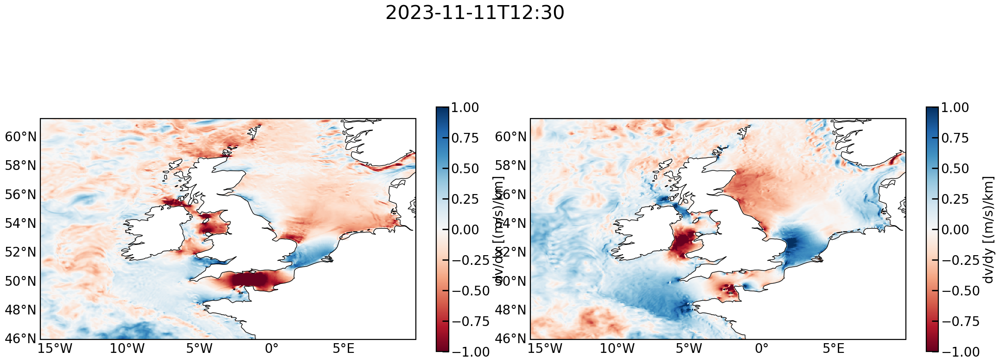

In [58]:
# plot components velocity fields next to eachother to compare:
# options
day_averaged = False
plot_time = 10.5 # in days 
naxes = 2
fig, axs = plt.subplots(1,naxes,figsize=(25,10),subplot_kw={'projection':ccrs.PlateCarree()})
tindex=int(plot_time*24)
if(day_averaged == True):
    pcm0 = axs[0].pcolormesh(LON, LAT ,dflow['uo'][tindex:tindex+24].mean(dim='time').values,cmap='RdBu', vmin=-1,vmax=1)
    pcm1 = axs[1].pcolormesh(LON, LAT ,dflow['vo'][tindex:tindex+24].mean(dim='time').values,cmap='RdBu', vmin=-1,vmax=1)
    
else:
    pcm0 = axs[0].pcolormesh(LON, LAT ,dflow['uo'][tindex].values,cmap='RdBu', vmin=-1,vmax=1)
    pcm1 = axs[1].pcolormesh(LON, LAT ,dflow['vo'][tindex].values,cmap='RdBu', vmin=-1,vmax=1)
date = dflow['time'][tindex].values
cxbar=fig.colorbar(pcm0,label='dv/dx [(m/s)/km]',fraction=0.03)
cxbar=fig.colorbar(pcm1,label='dv/dy [(m/s)/km]',fraction=0.03)
for a in range(0,naxes,1):
    axs[a].coastlines()  
    axs[a].set_xlabel('longitude [$^{\\circ}$]')
    axs[a].set_ylabel('latitude [$^{\\circ}$]')
    gl = axs[a].gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=0, color='gray', alpha=0.5, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 20}
    gl.ylabel_style =  {'size': 20}
    # axs[a].set_xlim(-3,9.5)
    # axs[a].set_ylim(50,60)

date = dflow['time'][tindex].values
if(day_averaged==True):
    fig.suptitle(f'daily average {np.datetime64(date,'D')}', fontsize=30) #options, Y, M, D, h, m, s for np.datetime
else:
    fig.suptitle(f'{np.datetime64(date,'m')}', fontsize=30)




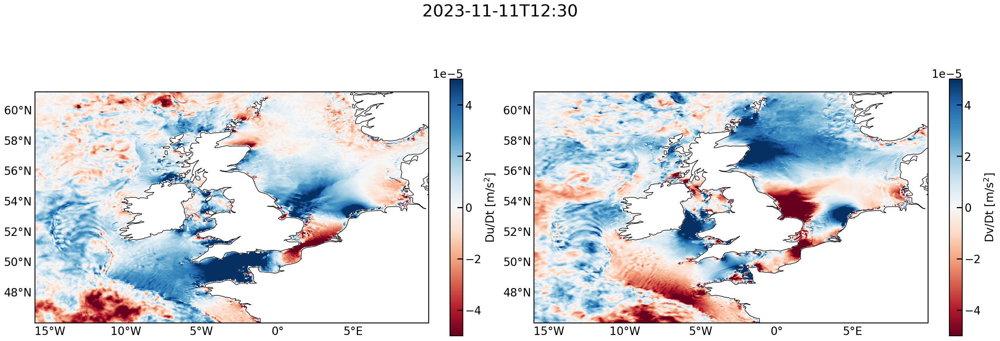

In [65]:
# plot material derivative

day_averaged = False
plot_time = 10.5 # in days 
naxes = 2
fig, axs = plt.subplots(1,naxes,figsize=(25,10),subplot_kw={'projection':ccrs.PlateCarree()})
tindex=int(plot_time*24)
if(day_averaged == True):
    pcm0 = axs[0].pcolormesh(LON[1:-1,1:-1], LAT[1:-1,1:-1], DuDt[tindex:tindex+24].mean(dim='time').values,cmap='RdBu',vmin=-0.00005,vmax=0.00005)
    pcm1 = axs[1].pcolormesh(LON[1:-1,1:-1], LAT[1:-1,1:-1], DvDt[tindex:tindex+24].mean(dim='time').values,cmap='RdBu',vmin=-0.00005,vmax=0.00005)

    
else:
    pcm0 = axs[0].pcolormesh(LON[1:-1,1:-1], LAT[1:-1,1:-1], DuDt[tindex].values,cmap='RdBu',vmin=-0.00005,vmax=0.00005)
    pcm1 = axs[1].pcolormesh(LON[1:-1,1:-1], LAT[1:-1,1:-1], DvDt[tindex].values,cmap='RdBu',vmin=-0.00005,vmax=0.00005)
date = dflow['time'][tindex].values
cxbar=fig.colorbar(pcm0,label='Du/Dt [m/s$^2$]', fraction = 0.03)
cxbar=fig.colorbar(pcm1,label='Dv/Dt [m/s$^2$]',fraction=0.03)
for a in range(0,naxes,1):
    axs[a].coastlines()  
    axs[a].set_xlabel('longitude [$^{\\circ}$]')
    axs[a].set_ylabel('latitude [$^{\\circ}$]')
    gl = axs[a].gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=0, color='gray', alpha=0.5, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 20}
    gl.ylabel_style =  {'size': 20}
    # axs[a].set_xlim(-3,9.5)
    # axs[a].set_ylim(50,60)

date = dflow['time'][tindex].values
if(day_averaged==True):
    fig.suptitle(f'daily average {np.datetime64(date,'D')}', fontsize=30) #options, Y, M, D, h, m, s for np.datetime
else:
    fig.suptitle(f'{np.datetime64(date,'m')}', fontsize=30)

fig.tight_layout()



In [23]:
# plot daily averaged vorticity field
# DuDtspeed = np.sqrt(DuDt**2+DvDt**2)
# set field
field = DuDt
name = 'DuDt'
vmin = -0.0002
vmax = 0.0002
day_averaged = True
if(day_averaged == True):
    Tmax = 30 #days
else:
    Tmax = 720 #hours 
for tindex in range(0,Tmax,1):
    fig, ax = plt.subplots(subplot_kw={'projection':ccrs.PlateCarree()})
    ax.coastlines()   

    # pcm = ax.pcolormesh(LON[1:-1,1:-1], LAT[1:-1,1:-1] , vorticity[tindex*24:(tindex+1)*24].mean(dim='time'),cmap='RdBu',vmin=-0.0002,vmax=0.0002)
    pcm = ax.pcolormesh(LON[1:-1,1:-1], LAT[1:-1,1:-1] , DvDt[tindex*24:(tindex+1)*24].mean(dim='time'),cmap='RdBu',vmin=-0.00005,vmax=0.00005)

    ax.set_xlabel('longitude [$^{\\circ}$]')
    ax.set_ylabel('latitude [$^{\\circ}$]')

    # cxbar=fig.colorbar(pcm,label='$\\omega $ [1/s]',fraction=0.03)
    cxbar=fig.colorbar(pcm,label='Dv/Dt [m/s$^2$]',fraction=0.03)

    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                    linewidth=0, color='gray', alpha=0.5, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 20}
    gl.ylabel_style =  {'size': 20}


    ax.set_title(f'{time[tindex*24]}', fontsize=20)
    # ax.set_xlim(-3,9.5)
    # ax.set_ylim(51,61)
    fig.tight_layout()
    # fig.savefig(f'../figures/eulerian_field/frames/november/vorticity/vorticity_day_averaged{tindex:04d}.png')
    fig.savefig(f'../figures/eulerian_field/frames/november/material_derivative/DvDt_day_averaged{tindex:04d}.png')
    plt.close(fig)

    # to make movie: ffmpeg -framerate 2 -i vorticity_day_averaged%04d.png  -vcodec libx264 -pix_fmt yuv420p -r 10 vorticity_day_averaged.mp4
    # ffmpeg -framerate 2 -i DuDt_day_averaged%04d.png  -vcodec libx264 -pix_fmt yuv420p -r 10 DuDt_day_averaged.mp4



In [67]:
# plot size vector material derivative
for tindex in range(0,24*2,1):#range(0,24*30-2,1):

    fig, ax = plt.subplots(figsize=(12,10),subplot_kw={'projection':ccrs.PlateCarree()})
    ax.coastlines()   

    pcm = ax.pcolormesh(LON, LAT, dflow['uo'][tindex].values,cmap='RdBu',vmin=-1.5,vmax=1.5)

    ax.set_xlabel('longitude [$^{\\circ}$]')
    ax.set_ylabel('latitude [$^{\\circ}$]')

    cxbar=fig.colorbar(pcm,label='u [m/s]',fraction=0.03)

    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                    linewidth=0, color='gray', alpha=0.5, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 20}
    gl.ylabel_style =  {'size': 20}


    ax.set_title(f'{time[tindex]}', fontsize=20)
    ax.set_xlim(-3,9.5)
    ax.set_ylim(51,61)
    fig.savefig(f'../figures/eulerian_field/frames/november/velocity/u_field_hourly{tindex:04d}.png')
    plt.close(fig)


In [21]:
# plot u field (averaged over 1 day (=2 tidal cycles))
for tindex in range(0,30,1):#range(0,24*30-2,1):

    fig, ax = plt.subplots(figsize=(12,10),subplot_kw={'projection':ccrs.PlateCarree()})
    ax.coastlines()   
    # dflow['uo'][tindex*24:(tindex+1)*24].mean(dim='time').values

    pcm = ax.pcolormesh(LON, LAT, dflow['vo'][tindex*24:(tindex+1)*24].mean(dim='time').values,cmap='RdBu',vmin=-1.5,vmax=1.5)

    ax.set_xlabel('longitude [$^{\\circ}$]')
    ax.set_ylabel('latitude [$^{\\circ}$]')

    cxbar=fig.colorbar(pcm,label='v [m/s]',fraction=0.03)

    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                    linewidth=0, color='gray', alpha=0.5, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 20}
    gl.ylabel_style =  {'size': 20}


    ax.set_title(f'{time[tindex*24]}', fontsize=20)
    # ax.set_xlim(-3,9.5)
    # ax.set_ylim(51,61)
    fig.savefig(f'../figures/eulerian_field/frames/november/velocity/v_field_day_avaraged{tindex:04d}.png')
    plt.close(fig)


In [22]:
# plot u field (averaged over 1 day (=2 tidal cycles))
for tindex in range(0,30,1):#range(0,24*30-2,1):

    fig, ax = plt.subplots(figsize=(12,10),subplot_kw={'projection':ccrs.PlateCarree()})
    ax.coastlines()   
    # dflow['uo'][tindex*24:(tindex+1)*24].mean(dim='time').values

    pcm = ax.pcolormesh(LON[1:-1,1:-1], LAT[1:-1,1:-1], DvDt[tindex*24:(tindex+1)*24].mean(dim='time').values,cmap='RdBu',vmin=-0.00005,vmax=0.00005)


    ax.set_xlabel('longitude [$^{\\circ}$]')
    ax.set_ylabel('latitude [$^{\\circ}$]')

    cxbar=fig.colorbar(pcm,label='Du/Dt [m/s$^2$]',fraction=0.03)

    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                    linewidth=0, color='gray', alpha=0.5, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 20}
    gl.ylabel_style =  {'size': 20}


    ax.set_title(f'{time[tindex*24]}', fontsize=20)
    ax.set_xlim(-3,9.5)
    ax.set_ylim(51,61)
    fig.savefig(f'../figures/eulerian_field/frames/november/velocity/DvDt_field_day_avaraged{tindex:04d}.png')
    plt.close(fig)


findfont: Font family ['cursive'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'cursive' not found because none of the following families were found: Apple Chancery, Textile, Zapf Chancery, Sand, Script MT, Felipa, Comic Neue, Comic Sans MS, cursive
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


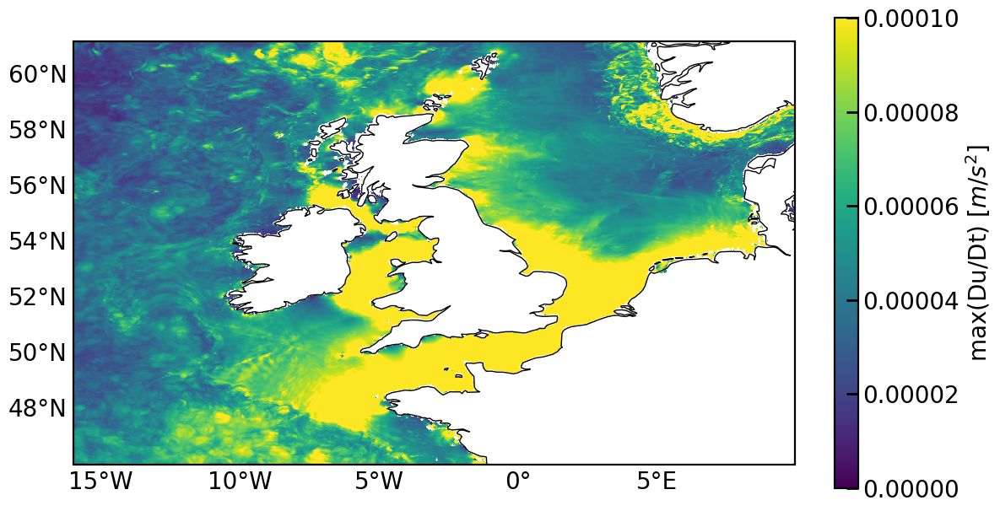

In [9]:
# plot maximum material 


fig, ax = plt.subplots(figsize=(12,10),subplot_kw={'projection':ccrs.PlateCarree()})
ax.coastlines()   

pcm = ax.pcolormesh(LON[1:-1,1:-1], LAT[1:-1,1:-1], np.max(np.sqrt((DuDt)**2+(DvDt)**2).values, axis = 0), cmap='viridis',vmin=0,vmax=0.0001)

ax.set_xlabel('longitude [$^{\\circ}$]')
ax.set_ylabel('latitude [$^{\\circ}$]')

cxbar=fig.colorbar(pcm,label='max(Du/Dt) [$m/s^2$]', fraction=0.03)

gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                linewidth=0, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 20}
gl.ylabel_style =  {'size': 20}



# ax.set_xlim(-3,9.5)
# ax.set_ylim(50,60)
   



(50.0, 60.0)

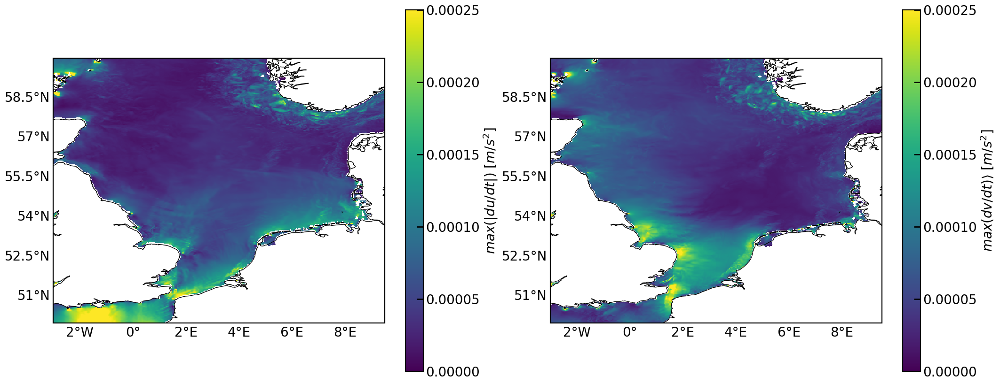

In [124]:
# plotmax absolute material derivative comonents
tindex = 10 
fig, axs = plt.subplots(1,2,figsize=(25,10),subplot_kw={'projection':ccrs.PlateCarree()})
axs[0].coastlines()   
axs[1].coastlines()   
# pcm = ax.pcolormesh(LON, LAT ,mean.values,cmap='coolwarm',vmin=-0.00001,vmax=0.00001)
pcm0 = axs[0].pcolormesh(LON[1:-1,1:-1], LAT[1:-1,1:-1], np.max(np.fabs(DuDt).values,axis=0),cmap='viridis',vmin=0,vmax=0.00025)
pcm1 = axs[1].pcolormesh(LON[1:-1,1:-1], LAT[1:-1,1:-1], np.max(np.fabs(DvDt).values,axis=0),cmap='viridis',vmin=0,vmax=0.00025)
# pcm = ax.pcolormesh(LON, LAT ,dvdt[0].values,cmap='coolwarm')#,cmap='coolwarm',vmin=-1,vmax=1)
axs[0].set_xlabel('longitude [$^{\\circ}$]')
axs[0].set_ylabel('latitude [$^{\\circ}$]')
axs[1].set_xlabel('longitude [$^{\\circ}$]')
axs[1].set_ylabel('latitude [$^{\\circ}$]')
cxbar=fig.colorbar(pcm0,label='$ max(|du/dt|)  $ [$m/s^2$]')
cxbar=fig.colorbar(pcm1,label='$ max(dv/dt) \\rangle $ [$m/s^2$]')
gl = axs[0].gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=0, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 20}
gl.ylabel_style =  {'size': 20}
gl = axs[1].gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=0, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 20}
gl.ylabel_style =  {'size': 20}

# fig.suptitle(DuDt['time'][tindex].values, fontsize=30)

axs[0].set_xlim(-3,9.5)
axs[0].set_ylim(50,60)
axs[1].set_xlim(-3,9.5)
axs[1].set_ylim(50,60)

In [102]:
# calculate mean absolute value velocities and mean absolute value material derivative
DuDt_abs_mean=np.sqrt((DuDt**2)).mean(dim='time').load()
DvDt_abs_mean=np.sqrt((DvDt**2)).mean(dim='time').load()
u_abs_mean=np.sqrt((u**2)).mean(dim='time').load()
v_abs_mean=np.sqrt((v**2)).mean(dim='time').load()


(50.0, 60.0)

findfont: Font family ['cursive'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'cursive' not found because none of the following families were found: Apple Chancery, Textile, Zapf Chancery, Sand, Script MT, Felipa, Comic Neue, Comic Sans MS, cursive
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


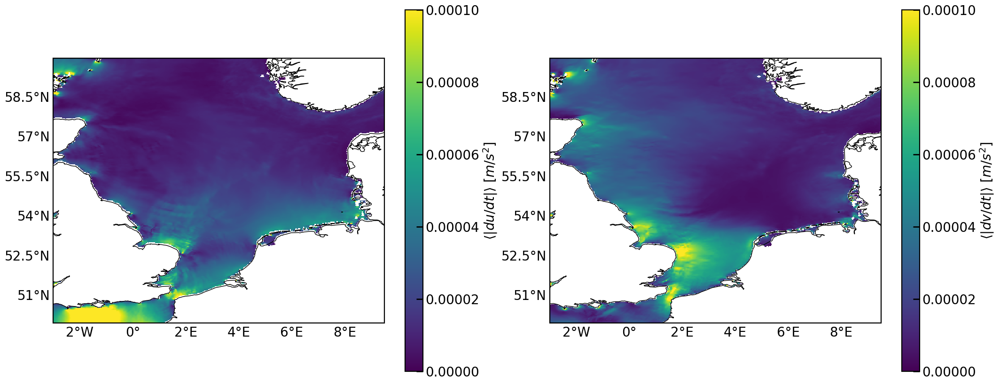

In [103]:
# plot mean absolute value material derivative
tindex = 10 
fig, axs = plt.subplots(1,2,figsize=(25,10),subplot_kw={'projection':ccrs.PlateCarree()})
axs[0].coastlines()   
axs[1].coastlines()   
# pcm = ax.pcolormesh(LON, LAT ,mean.values,cmap='coolwarm',vmin=-0.00001,vmax=0.00001)
pcm0 = axs[0].pcolormesh(LON[1:-1,1:-1], LAT[1:-1,1:-1], DuDt_abs_mean.values,cmap='viridis',vmin=0,vmax=0.1*10**(-3))
pcm1 = axs[1].pcolormesh(LON[1:-1,1:-1], LAT[1:-1,1:-1], DvDt_abs_mean.values,cmap='viridis',vmin=0,vmax=0.1*10**(-3))
# pcm = ax.pcolormesh(LON, LAT ,dvdt[0].values,cmap='coolwarm')#,cmap='coolwarm',vmin=-1,vmax=1)
axs[0].set_xlabel('longitude [$^{\\circ}$]')
axs[0].set_ylabel('latitude [$^{\\circ}$]')
axs[1].set_xlabel('longitude [$^{\\circ}$]')
axs[1].set_ylabel('latitude [$^{\\circ}$]')
cxbar=fig.colorbar(pcm0,label='$ \\langle |du/dt| \\rangle $ [$m/s^2$]')
cxbar=fig.colorbar(pcm1,label='$ \\langle |dv/dt| \\rangle $ [$m/s^2$]')
gl = axs[0].gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=0, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 20}
gl.ylabel_style =  {'size': 20}
gl = axs[1].gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=0, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 20}
gl.ylabel_style =  {'size': 20}

# fig.suptitle(DuDt['time'][tindex].values, fontsize=30)

axs[0].set_xlim(-3,9.5)
axs[0].set_ylim(50,60)
axs[1].set_xlim(-3,9.5)
axs[1].set_ylim(50,60)

In [ ]:
# plot mean absolute value velocity
tindex = 10 
fig, axs = plt.subplots(1,2,figsize=(25,10),subplot_kw={'projection':ccrs.PlateCarree()})
axs[0].coastlines()   
axs[1].coastlines()   
# pcm = ax.pcolormesh(LON, LAT ,mean.values,cmap='coolwarm',vmin=-0.00001,vmax=0.00001)
pcm0 = axs[0].pcolormesh(LON[1:-1,1:-1], LAT[1:-1,1:-1], u_abs_mean.values,cmap='viridis',vmin=0,vmax=1)
pcm1 = axs[1].pcolormesh(LON[1:-1,1:-1], LAT[1:-1,1:-1], v_abs_mean.values,cmap='viridis',vmin=0,vmax=1)
# pcm = ax.pcolormesh(LON, LAT ,dvdt[0].values,cmap='coolwarm')#,cmap='coolwarm',vmin=-1,vmax=1)
axs[0].set_xlabel('longitude [$^{\\circ}$]')
axs[0].set_ylabel('latitude [$^{\\circ}$]')
axs[1].set_xlabel('longitude [$^{\\circ}$]')
axs[1].set_ylabel('latitude [$^{\\circ}$]')
cxbar=fig.colorbar(pcm0,label='$\\langle u \\rangle $ [m/s]')
cxbar=fig.colorbar(pcm1,label='$\\langle v \\rangle $ [m/s]')
gl = axs[0].gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=0, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 20}
gl.ylabel_style =  {'size': 20}
gl = axs[1].gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=0, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 20}
gl.ylabel_style =  {'size': 20}

# fig.suptitle(DuDt['time'][tindex].values, fontsize=30)

axs[0].set_xlim(-3,9.5)
axs[0].set_ylim(50,60)
axs[1].set_xlim(-3,9.5)
axs[1].set_ylim(50,60)

(50.0, 60.0)

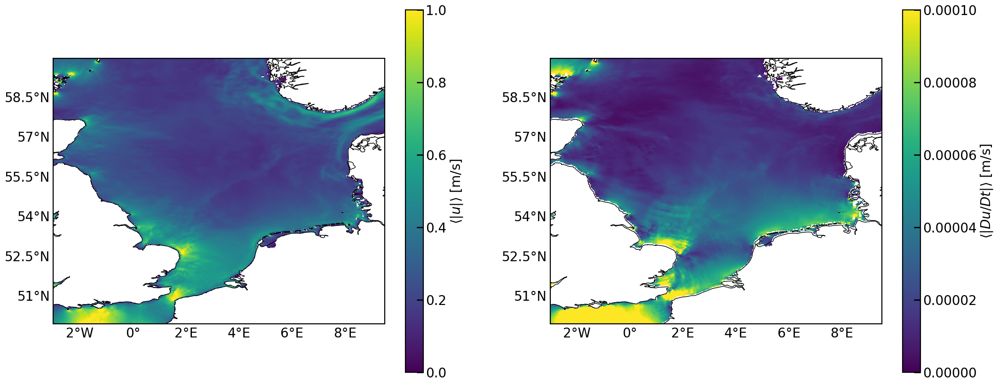

In [104]:
# plot mean absolute value velocity
tindex = 10 
fig, axs = plt.subplots(1,2,figsize=(25,10),subplot_kw={'projection':ccrs.PlateCarree()})
axs[0].coastlines()   
axs[1].coastlines()   
# pcm = ax.pcolormesh(LON, LAT ,mean.values,cmap='coolwarm',vmin=-0.00001,vmax=0.00001)
pcm0 = axs[0].pcolormesh(LON[1:-1,1:-1], LAT[1:-1,1:-1], np.sqrt(u_abs_mean**2+v_abs_mean**2).values,cmap='viridis',vmin=0,vmax=1)
pcm1 = axs[1].pcolormesh(LON[1:-1,1:-1], LAT[1:-1,1:-1], np.sqrt(DuDt_abs_mean**2+DuDt_abs_mean**2).values,cmap='viridis',vmin=0,vmax=0.0001)
# pcm = ax.pcolormesh(LON, LAT ,dvdt[0].values,cmap='coolwarm')#,cmap='coolwarm',vmin=-1,vmax=1)
axs[0].set_xlabel('longitude [$^{\\circ}$]')
axs[0].set_ylabel('latitude [$^{\\circ}$]')
axs[1].set_xlabel('longitude [$^{\\circ}$]')
axs[1].set_ylabel('latitude [$^{\\circ}$]')
cxbar=fig.colorbar(pcm0,label='$\\langle |u| \\rangle $ [m/s]')
cxbar=fig.colorbar(pcm1,label='$\\langle |Du/Dt| \\rangle $ [m/s]')
gl = axs[0].gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=0, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 20}
gl.ylabel_style =  {'size': 20}
gl = axs[1].gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=0, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 20}
gl.ylabel_style =  {'size': 20}

# fig.suptitle(DuDt['time'][tindex].values, fontsize=30)

axs[0].set_xlim(-3,9.5)
axs[0].set_ylim(50,60)
axs[1].set_xlim(-3,9.5)
axs[1].set_ylim(50,60)

In [ ]:
# plot mean absolute value velocity
tindex = 10 
fig, ax = plt.subplots(1,figsize=(12,10),subplot_kw={'projection':ccrs.PlateCarree()})
ax.coastlines()   

pcm= ax.pcolormesh(LON[1:-1,1:-1], LAT[1:-1,1:-1], np.sqrt(DuDt_abs_mean**2+DuDt_abs_mean**2).values/np.sqrt(u_abs_mean**2+v_abs_mean**2).values,cmap='viridis',vmin=0,vmax=0.00025)

ax.set_xlabel('longitude [$^{\\circ}$]')
ax.set_ylabel('latitude [$^{\\circ}$]')

cxbar=fig.colorbar(pcm,label='$\\langle u \\rangle $ [m/s]')

gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=0, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 20}
gl.ylabel_style =  {'size': 20}


# fig.suptitle(DuDt['time'][tindex].values, fontsize=30)

ax.set_xlim(-3,9.5)
ax.set_ylim(50,60)


## Lagrangian analysis
below we perform the lagrangian analysis where we compare 
tracer particles (only advected with the velocity of the fluid) with
MR/inertial particles (advected with the reduced MR equations (both velocity of the fluid and term that is dependent on material derivative fluid))

### Import data

In [3]:
runtime =  timedelta(days=30)
loc = 'north-sea'
B = 0.7
tau = 2.7
nparticles = 68476
chunck_time = 100

starttimes=np.array([datetime(2023, 9, 1, 0, 0, 0, 0),
                      datetime(2023, 10, 1, 0, 0, 0, 0),
                      datetime(2023, 11, 1, 0, 0, 0, 0),
                      datetime(2023, 12, 1, 0, 0, 0, 0),
                      datetime(2024, 1, 1, 0, 0, 0, 0),
                      datetime(2024, 2, 1, 0, 0, 0, 0)]) #

years= np.array([2023,2024])
months = np.array([1,2,3,4,5,6,7,8,9,10,11,12])



data = {}
data[2023] = {}
data[2024] = {}


for starttime in starttimes:
    print(starttime)
    endtime = starttime + runtime 
    file_tracer =   basefile_tracer.format(loc=loc,
                                           y_s=starttime.year,
                                           m_s=starttime.month,
                                           d_s=starttime.day,
                                           y_e=endtime.year,
                                           m_e=endtime.month,
                                           d_e=endtime.day)

    data[starttime.year][starttime.month] = xr.open_dataset(file_tracer,
                                                             engine='zarr',
                                                             chunks={'trajectory':nparticles, 'obs':chunck_time},
                                                             drop_variables=['B','tau','z'],
                                                             decode_times=False) #,decode_cf=False)

    data[starttime.year][starttime.month] = data[starttime.year][starttime.month].rename({'lon':'lon_tracer', 'lat':'lat_tracer', 'time':'time_tracer'})

    file_MRSM =   basefile_MRSM.format(loc=loc,
                                       y_s=starttime.year,
                                       m_s=starttime.month,
                                       d_s=starttime.day,
                                       y_e=endtime.year,
                                       m_e=endtime.month,
                                       d_e=endtime.day,
                                       B = int(B * 1000), 
                                       tau = int(tau * 1000))
    dsMR = xr.open_dataset(file_MRSM,
                           engine='zarr',
                           chunks={'trajectory':68476, 'obs':100},
                           drop_variables=['B','tau','z'],
                           decode_times=False)  #,decode_cf=False)
    dsMR = dsMR.rename({'lon':'lon_MR', 'lat':'lat_MR','time':'time_MR'})
    data[starttime.year][starttime.month] = data[starttime.year][starttime.month].merge(dsMR)

2023-09-01 00:00:00
2023-10-01 00:00:00
2023-11-01 00:00:00
2023-12-01 00:00:00
2024-01-01 00:00:00
2024-02-01 00:00:00


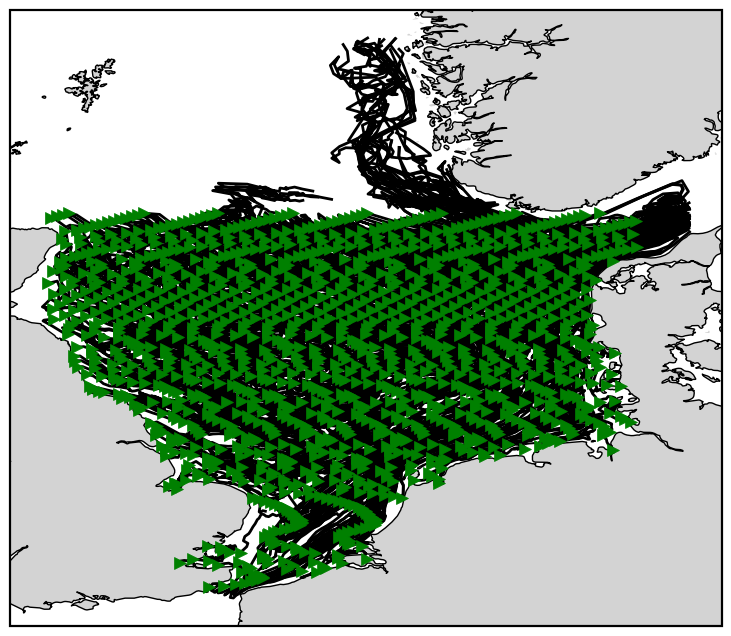

In [74]:
# plot selection of trajectories
year=2024
month=2

fig,ax = plt.subplots(subplot_kw={'projection':ccrs.PlateCarree()})
ax.coastlines()
ax.add_feature(cart.feature.LAND, facecolor='lightgrey')
ax.plot(data[year][month]['lon_tracer'][0::50,0].values,
        data[year][month]['lat_tracer'][0::50,0].values,
        '>',
        color='green',
        zorder=20)
ax.plot(data[year][month]['lon_tracer'][0::50,0::24].values.T,
        data[year][month]['lat_tracer'][0::50,0::24].values.T,
        '-',
        color='black');


## Along track displacement

2023-09-01 00:00:00
2023-10-01 00:00:00
2023-11-01 00:00:00
2023-12-01 00:00:00
2024-01-01 00:00:00
2024-02-01 00:00:00


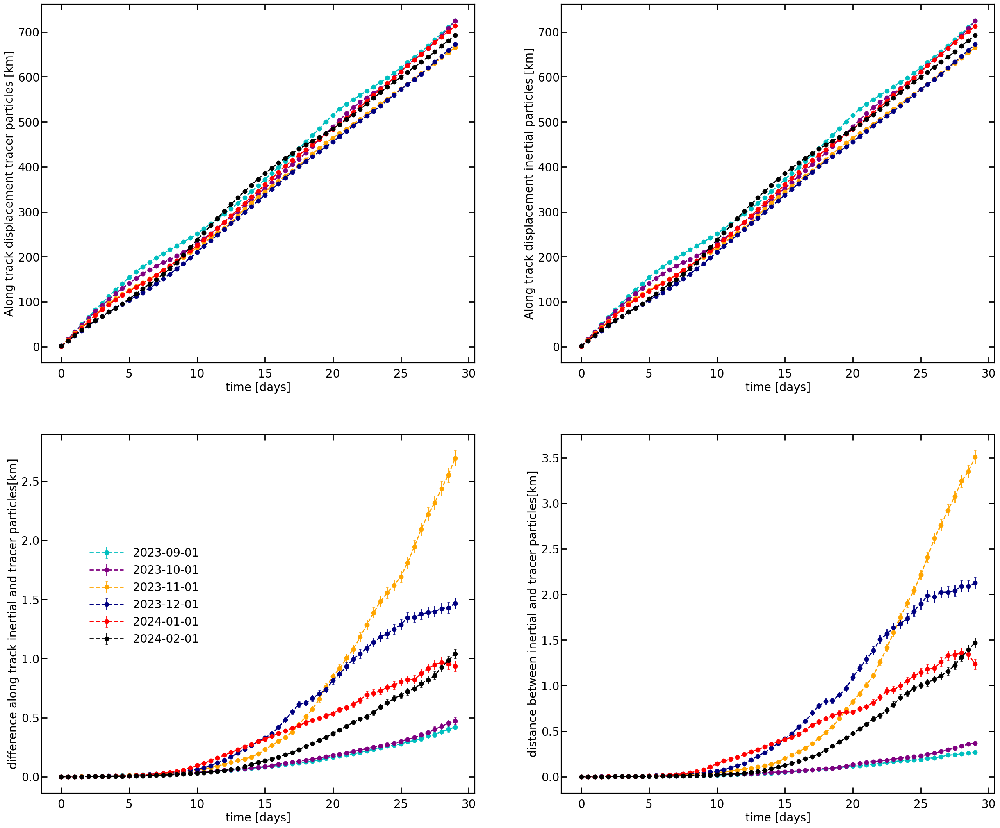

In [4]:
## along track displacement for entire region

fig,axs = plt.subplots(2,2,figsize=(30,25))
i=0
legend=[]
for starttime in starttimes:
    print(starttime)
    year = starttime.year
    month = starttime.month
    legend.append(f'{year}-{month:02d}-01')
    nanend=np.full((nparticles,1),np.nan)
    traj_tracer=trajectory_length(data[year][month]['lon_tracer'].values,
                                  data[year][month]['lat_tracer'].values)
    traj_tracer=np.concatenate((traj_tracer,nanend),axis=1)
    traj_MR=trajectory_length(data[year][month]['lon_MR'].values,data[year][month]['lat_MR'].values)
    traj_MR=np.concatenate((traj_MR,nanend),axis=1)
    diff_traj = np.fabs(traj_tracer - traj_MR)
    dist_tracer_MR = Haversine(data[year][month]['lon_tracer'],data[year][month]['lat_tracer'],
                               data[year][month]['lon_MR'], data[year][month]['lat_MR'])
    
    da_tracer = xr.DataArray(traj_tracer, dims=['trajectory','obs'])
    da_MR = xr.DataArray(traj_MR, dims=['trajectory','obs'])
    da_diff = xr.DataArray(diff_traj, dims=['trajectory','obs'])
    da_dist = xr.DataArray(dist_tracer_MR, dims=['trajectory','obs'])
    data[year][month]=data[year][month].assign(traj_tracer = da_tracer)
    data[year][month]=data[year][month].assign(traj_MR = da_MR)
    data[year][month]=data[year][month].assign(traj_diff = da_diff)
    data[year][month]=data[year][month].assign(dist_tracer_MR = da_dist)

    mean_tracer = data[year][month]['traj_tracer'].mean(dim='trajectory', skipna=True)
    mean_MR = data[year][month]['traj_MR'].mean(dim='trajectory', skipna=True)
    mean_diff = data[year][month]['traj_diff'].mean(dim='trajectory', skipna=True)
    mean_dist = data[year][month]['dist_tracer_MR'].mean(dim='trajectory', skipna=True)
    std_tracer = data[year][month]['traj_tracer'].std(dim='trajectory', skipna=True,ddof=1);
    std_MR = data[year][month]['traj_MR'].std(dim='trajectory', skipna=True,ddof=1);
    std_diff = data[year][month]['traj_diff'].std(dim='trajectory', skipna=True,ddof=1);
    std_dist = data[year][month]['dist_tracer_MR'].std(dim='trajectory', skipna=True,ddof=1);
    norm_tracer = data[year][month]['traj_tracer'].count(dim='trajectory')
    norm_MR = data[year][month]['traj_MR'].count(dim='trajectory')
    norm_diff = data[year][month]['traj_diff'].count(dim='trajectory')
    norm_dist = data[year][month]['dist_tracer_MR'].count(dim='trajectory')

    tmax=700
    tstep=12
    tlist=np.arange(0,tmax,tstep)/24
    axs[0,0].errorbar(tlist, mean_tracer[:tmax:tstep].values,
                      (std_tracer[:tmax:tstep]/np.sqrt(norm_tracer[:tmax:tstep])).values,
                      fmt='--o',color=colorlist[i])
    axs[0,1].errorbar(tlist, mean_MR[:tmax:tstep].values,
                      (std_MR[:tmax:tstep]/np.sqrt(norm_MR[:tmax:tstep])).values,
                      fmt='--o', color=colorlist[i])
    axs[1,0].errorbar(tlist, mean_diff[:tmax:tstep].values,
                      (std_diff[:tmax:tstep]/np.sqrt(norm_diff[:tmax:tstep])).values,
                      fmt='--o', color=colorlist[i])
    axs[1,1].errorbar(tlist, mean_dist[:tmax:tstep].values,
                      (std_dist[:tmax:tstep]/np.sqrt(norm_dist[:tmax:tstep])).values,
                      fmt='--o', color=colorlist[i])
    i+=1

axs[0,0].set_xlabel('time [days]')
axs[0,1].set_xlabel('time [days]')
axs[1,0].set_xlabel('time [days]')
axs[1,1].set_xlabel('time [days]')

axs[0,0].set_ylabel('Along track displacement tracer particles [km]')
axs[0,1].set_ylabel('Along track displacement inertial particles [km]')
axs[1,0].set_ylabel('difference along track inertial and tracer particles[km]')
axs[1,1].set_ylabel('distance between inertial and tracer particles[km]')

axs[1,0].legend(legend,loc=(0.1,0.4))


2023-09-01 00:00:00
2023-10-01 00:00:00
2023-11-01 00:00:00
2023-12-01 00:00:00
2024-01-01 00:00:00
2024-02-01 00:00:00


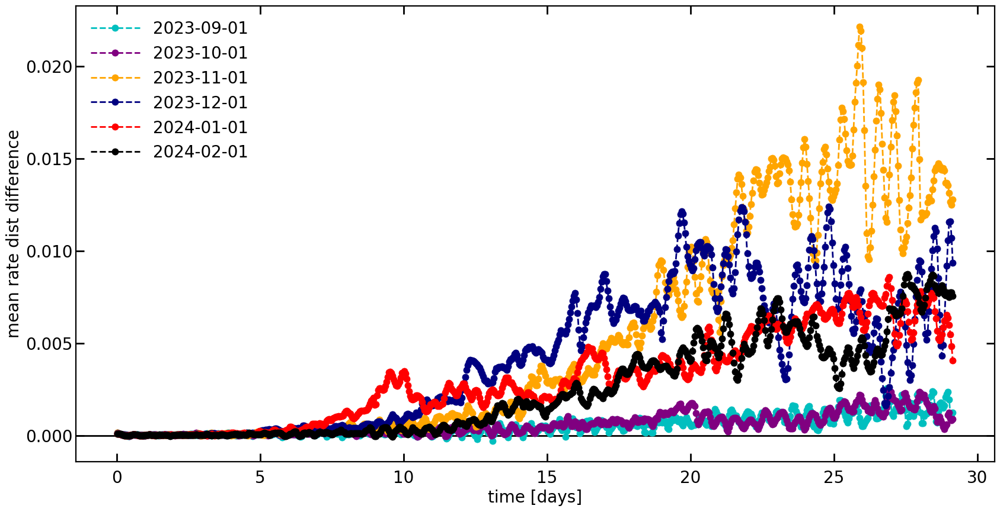

In [12]:
#plot difference rate (per hour)
i = 0 
tmax = 700
tstep = 1
fig,ax=plt.subplots(figsize=(20,10))
for starttime in starttimes:
    print(starttime)
    year = starttime.year
    month = starttime.month
    rate_dist = data[year][month].dist_tracer_MR.diff(dim='obs',n=1) # difference is 

    
    mean_rate_dist =rate_dist.mean(dim='trajectory', skipna=True)
    std_rate_dist = rate_dist.std(dim='trajectory', skipna=True,ddof=1);
    norm_rate_dist = data[year][month]['dist_tracer_MR'].count(dim='trajectory');
    tlist=np.arange(0,tmax,tstep)+0.5
    ax.plot(tlist/24, mean_rate_dist[:tmax:tstep].values,
                     '--o', color=colorlist[i])
    i+=1
    
ax.set_xlabel('time [days]')
ax.set_ylabel('mean rate dist difference')
ax.axhline(0,color='black',zorder=-20)
ax.legend(legend)
    
# note that first you see tidal signal (particles follow diferent trajectoreis through tide, but net deplacement purely to tide is zero because it is a periodic signal
# after approx 30 hours strong tidal signal is lost (however this is for entire region so probably selecting a subregion would make things different)

2023-09-01 00:00:00
fraction (dist > 1 km) = 0.0398
2023-10-01 00:00:00
fraction (dist > 1 km) = 0.0272
2023-11-01 00:00:00
fraction (dist > 1 km) = 0.1226
2023-12-01 00:00:00
fraction (dist > 1 km) = 0.0761
2024-01-01 00:00:00
fraction (dist > 1 km) = 0.0535
2024-02-01 00:00:00
fraction (dist > 1 km) = 0.0566


(50.0, 61.5)

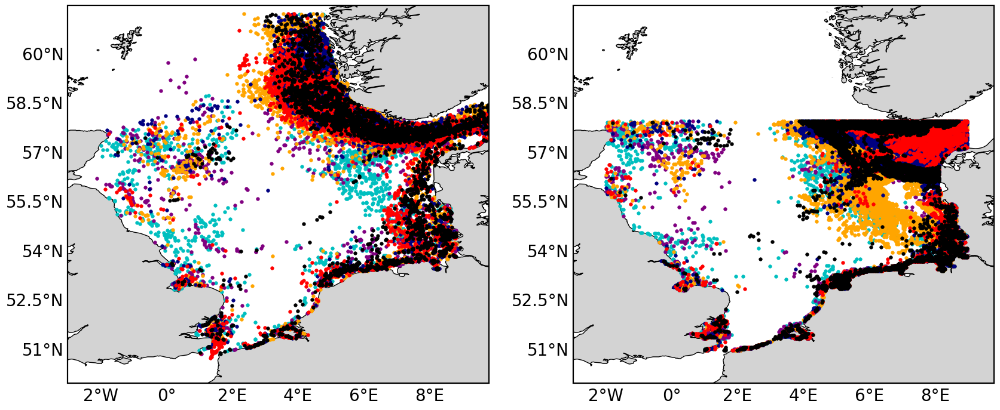

In [7]:
# plot trajectories particles when it is for the first time > cmax 

cmax = 1 # km
i=0
fig,axs=plt.subplots(1,2,figsize=(20,10),
                     subplot_kw={'projection':ccrs.PlateCarree()})
for starttime in starttimes:
    print(starttime)
    year = starttime.year
    month = starttime.month
    
    # make dataset where only values where difference bigger than cmax are saved
    ds_cmax = data[year][month].where(data[year][month].dist_tracer_MR > cmax)

    first_lon = ds_cmax.lon_tracer.bfill(dim='obs')[:,0]
    first_lat = ds_cmax.lat_tracer.bfill(dim='obs')[:,0]
    #use bfill to plot first nonnan value
    axs[0].plot(first_lon, first_lat,'.',color=colorlist[i])
    
    select=~np.isnan(first_lon.values)  
    index_select = np.arange(0,nparticles,1)[select]

    start_lon = data[year][month].lon_tracer[select,0]
    start_lat = data[year][month].lat_tracer[select,0]
    axs[1].plot(start_lon,start_lat,'.',color=colorlist[i])



    ntotal=ds_cmax.lon_tracer.bfill(dim='obs')[:,0].dropna('trajectory').shape[0]
    print(f'fraction (dist > {cmax} km) = {ntotal/nparticles:.04f}')
    i+=1
axs[0].coastlines()
axs[0].add_feature(cart.feature.LAND,facecolor='lightgrey')
axs[1].coastlines()
axs[1].add_feature(cart.feature.LAND,facecolor='lightgrey')
gl = axs[0].gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                linewidth=0, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 20}
gl.ylabel_style =  {'size': 20}
gl = axs[1].gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                linewidth=0, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 20}
gl.ylabel_style =  {'size': 20}

axs[0].set_xlim(-3,9.8)
axs[0].set_ylim(50,61.5)
axs[1].set_xlim(-3,9.8)
axs[1].set_ylim(50,61.5)


2023-09-01 00:00:00
fraction (dist > 0.5 km) = 0.0621
2023-10-01 00:00:00
fraction (dist > 0.5 km) = 0.0411
2023-11-01 00:00:00
fraction (dist > 0.5 km) = 0.1466
2023-12-01 00:00:00
fraction (dist > 0.5 km) = 0.0904
2024-01-01 00:00:00
fraction (dist > 0.5 km) = 0.0662
2024-02-01 00:00:00
fraction (dist > 0.5 km) = 0.0706


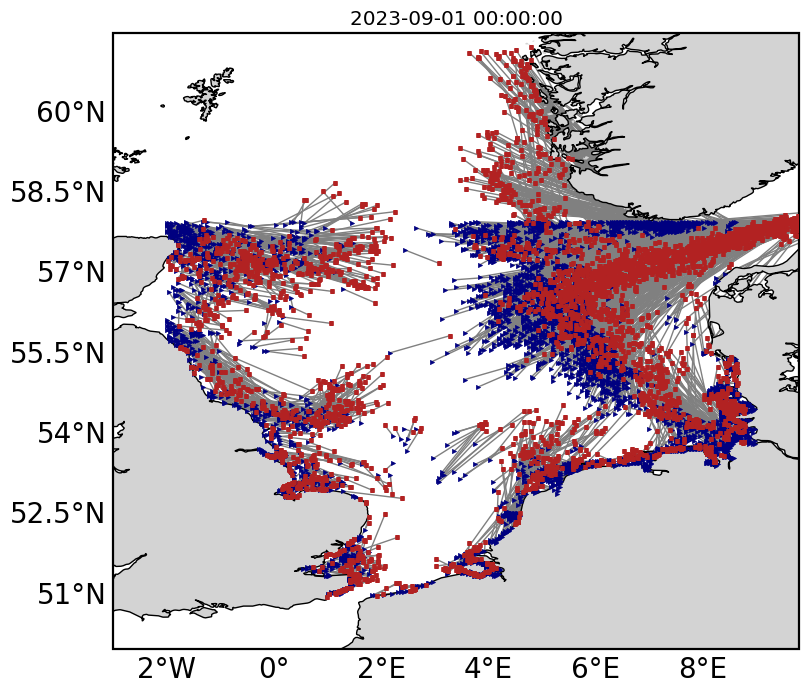

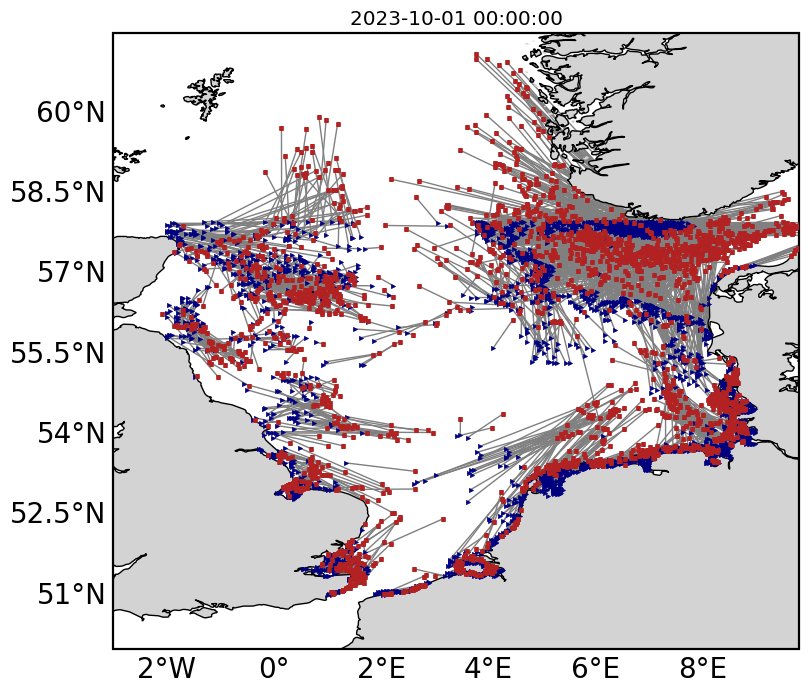

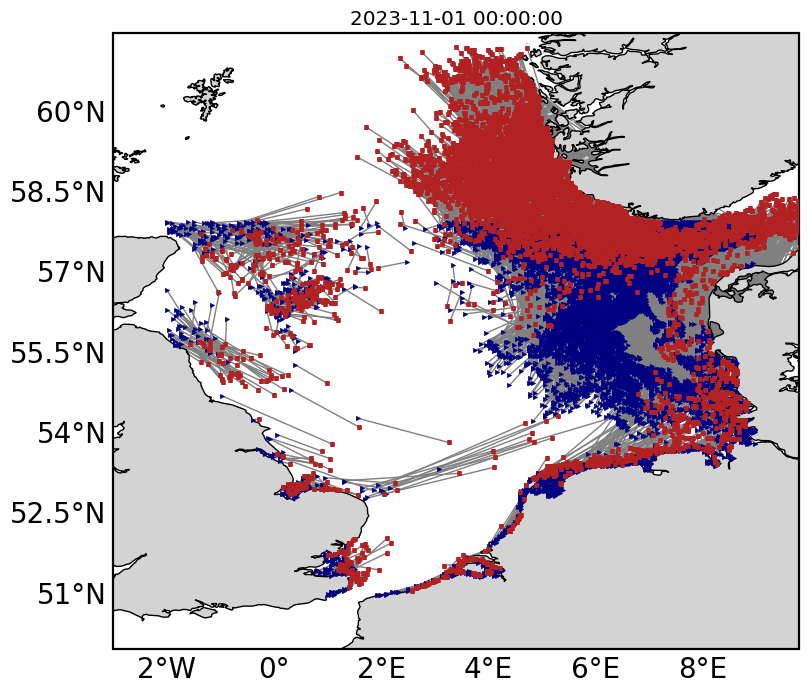

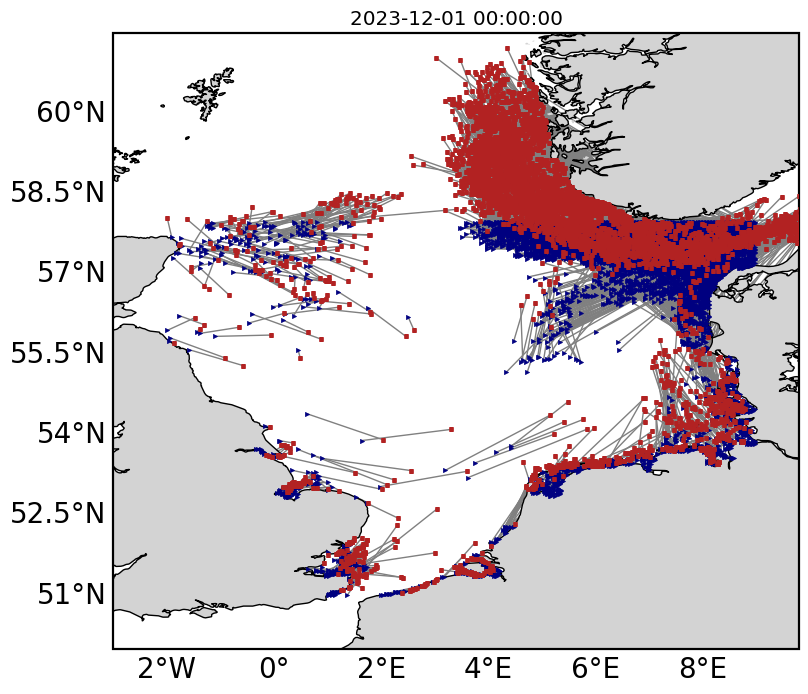

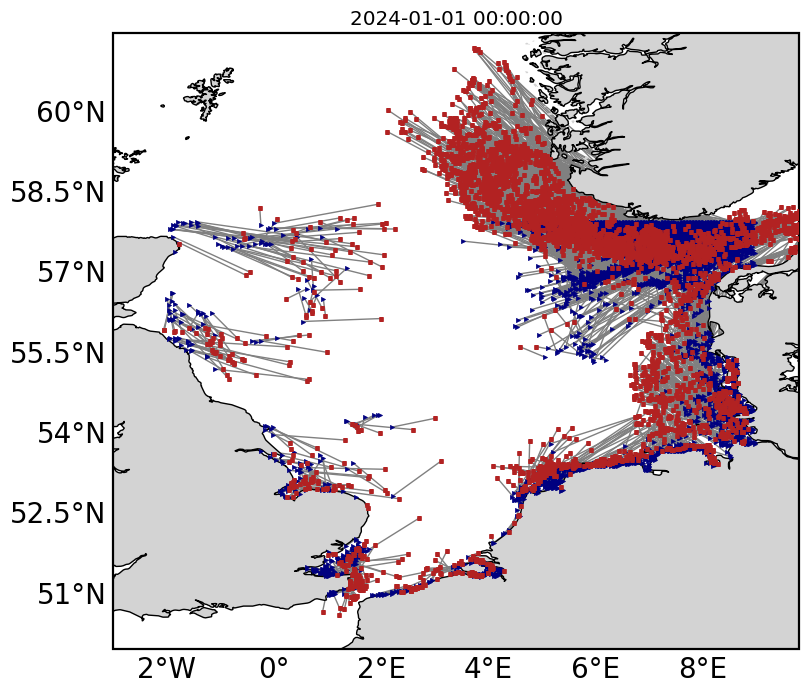

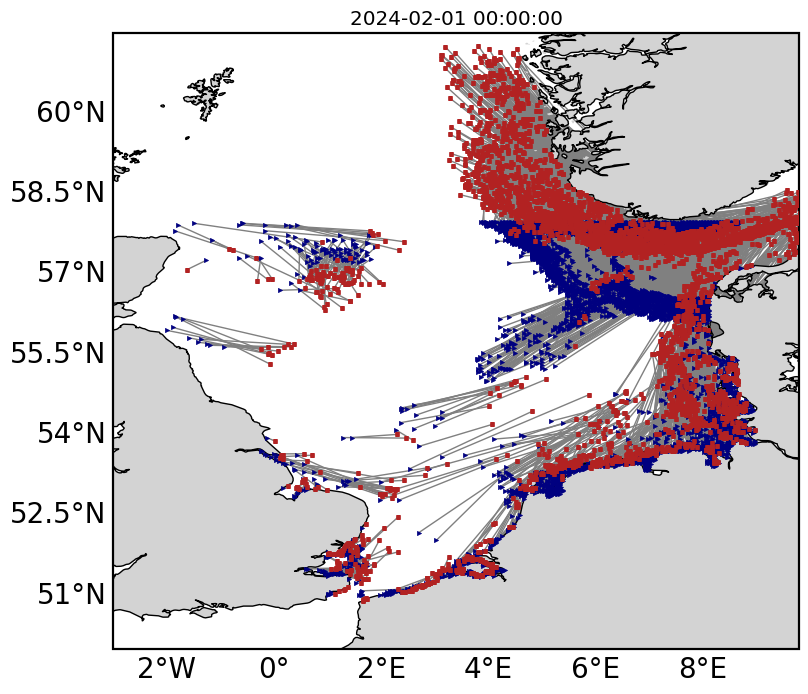

In [90]:
# plot trajectories particles when it is for the first time > cmax 

cmax = 0.5 #1 # 0.1 # km
i=0

for starttime in starttimes:
    fig,ax = plt.subplots(subplot_kw={'projection':ccrs.PlateCarree()})
    print(starttime)
    year = starttime.year
    month = starttime.month
    
    # make dataset where only values where difference bigger than cmax are saved
    ds_cmax = data[year][month].where(data[year][month].dist_tracer_MR > cmax)

    first_lon = ds_cmax.lon_tracer.bfill(dim='obs')[:,0]
    first_lon_p = first_lon.values#
    first_lon_p= first_lon_p[~np.isnan(first_lon_p)]
    first_lat = ds_cmax.lat_tracer.bfill(dim='obs')[:,0]
    first_lat_p = first_lat.values#
    first_lat_p =first_lat_p[~np.isnan(first_lat_p)]

    #use bfill to plot first nonnan value
    ax.plot(first_lon_p, first_lat_p,'s',color='firebrick',markersize=3,zorder=20)
    
    select=~np.isnan(first_lon.values)  
    index_select = np.arange(0,nparticles,1)[select]

    start_lon = data[year][month].lon_tracer[select,0]
    start_lat = data[year][month].lat_tracer[select,0]
    ax.plot(start_lon,start_lat,'>',color='navy',markersize=3)

    ax.plot(np.array([start_lon,first_lon_p]),np.array([start_lat, first_lat_p]),'-',color='grey',linewidth=1,zorder=-20)
    # print(start_lat.shape)
    # print(first_lat_p.shape)

    ntotal=ds_cmax.lon_tracer.bfill(dim='obs')[:,0].dropna('trajectory').shape[0]
    print(f'fraction (dist > {cmax} km) = {ntotal/nparticles:.04f}')
    i+=1
    ax.coastlines()
    ax.add_feature(cart.feature.LAND,facecolor='lightgrey')

    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                    linewidth=0, color='gray', alpha=0.5, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 20}
    gl.ylabel_style =  {'size': 20}


    ax.set_xlim(-3,9.8)
    ax.set_ylim(50,61.5)
    ax.set_title(starttime)



2023-09-01 00:00:00
2023-10-01 00:00:00
2023-11-01 00:00:00
2023-12-01 00:00:00
2024-01-01 00:00:00
2024-02-01 00:00:00


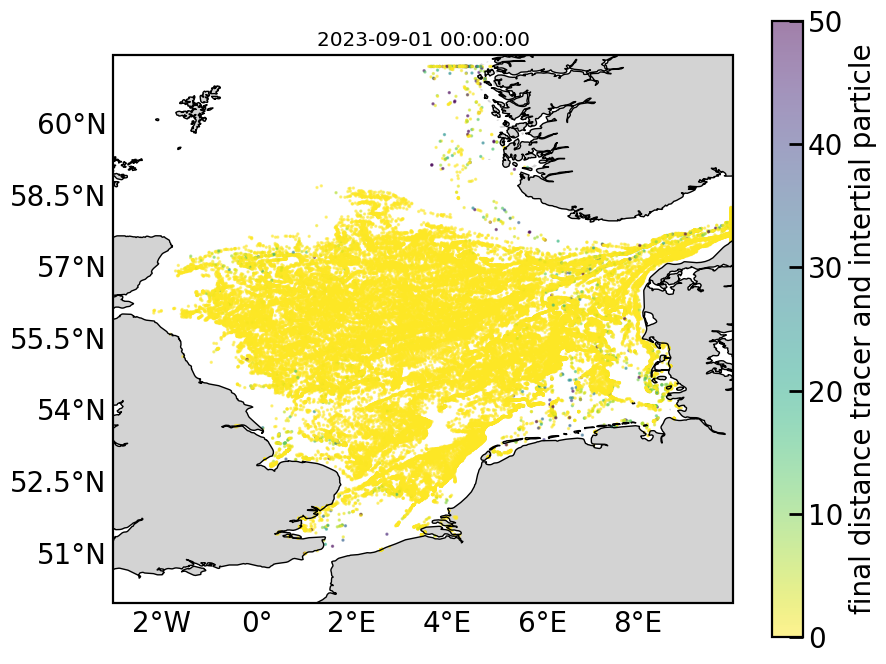

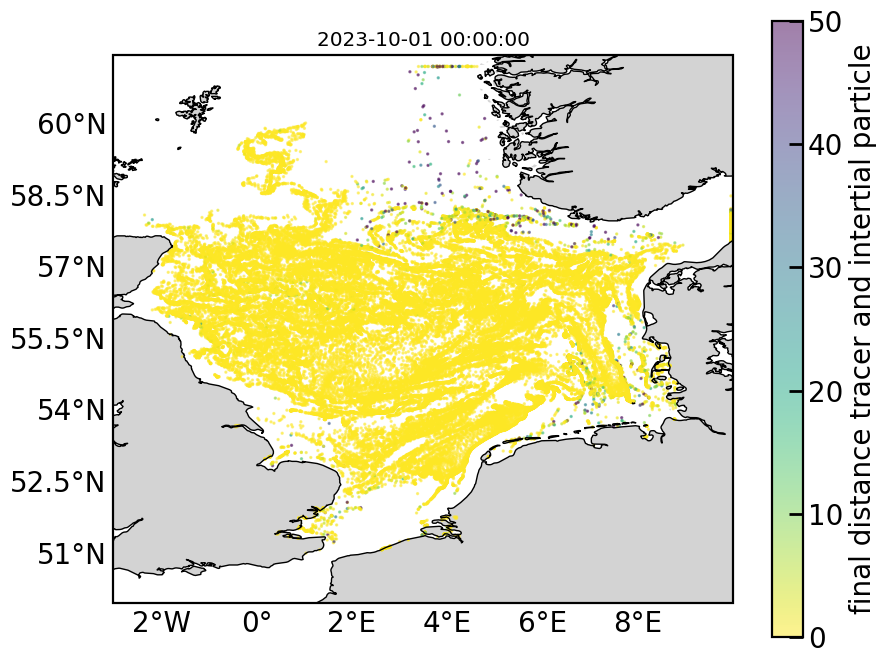

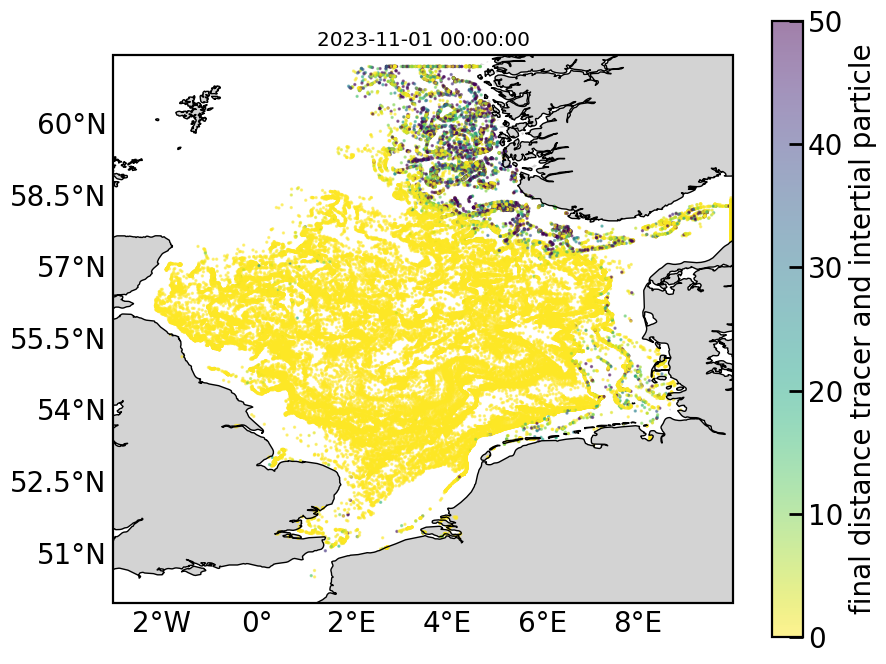

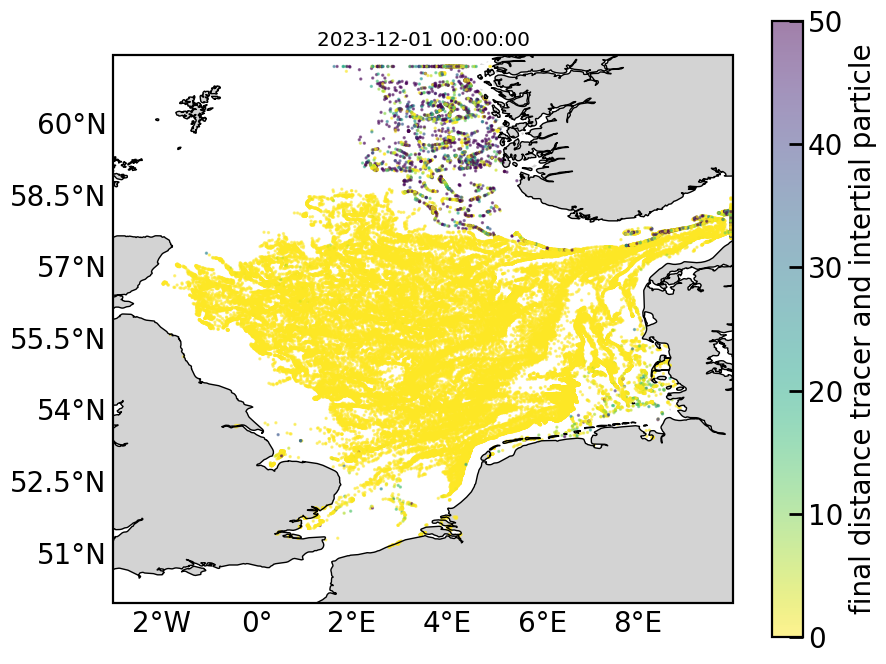

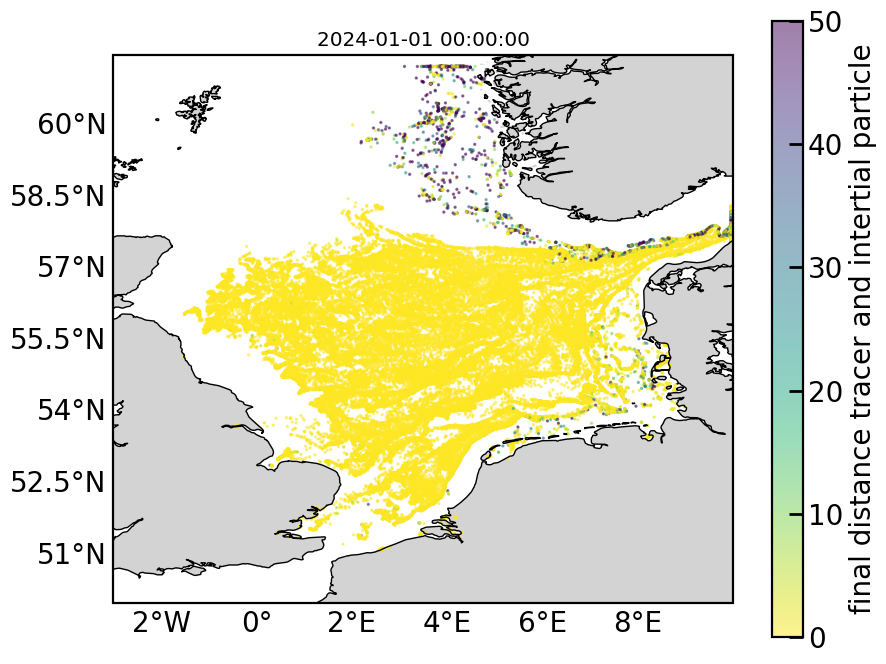

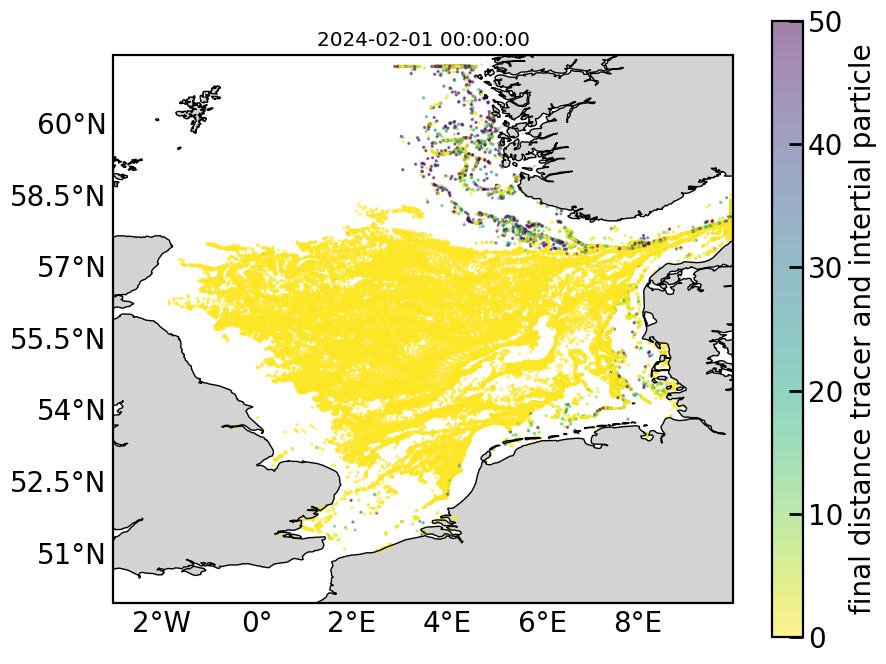

In [84]:
# scatter final position particle colored according to separation disance MR particle and tracer particle

cmax = 1 #1 # 0.1 # km
i=0

for starttime in starttimes:
    fig,ax = plt.subplots(subplot_kw={'projection':ccrs.PlateCarree()})
    print(starttime)
    year = starttime.year
    month = starttime.month
    
    # final (non-nan) value of trajectory
    final_lon = data[year][month].lon_tracer.ffill(dim='obs')[:,-1]
    final_lat = data[year][month].lat_tracer.ffill(dim='obs')[:,-1]
    final_separation = data[year][month].dist_tracer_MR.ffill(dim='obs')[:,-1]
    #use bfill to plot first nonnan value
    sc=ax.scatter(final_lon, final_lat,s=2,c=final_separation,alpha=0.5,cmap='viridis_r',vmin=0,vmax=50)
    cxbar=fig.colorbar(sc,label='final distance tracer and intertial particle')
   

    i+=1
    ax.coastlines()
    ax.add_feature(cart.feature.LAND,facecolor='lightgrey')

    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                    linewidth=0, color='gray', alpha=0.5, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 20}
    gl.ylabel_style =  {'size': 20}


    ax.set_xlim(-3,10)
    ax.set_ylim(50,61.5)
    ax.set_title(starttime)



2023-09-01 00:00:00
2023-10-01 00:00:00
2023-11-01 00:00:00
2023-12-01 00:00:00
2024-01-01 00:00:00
2024-02-01 00:00:00


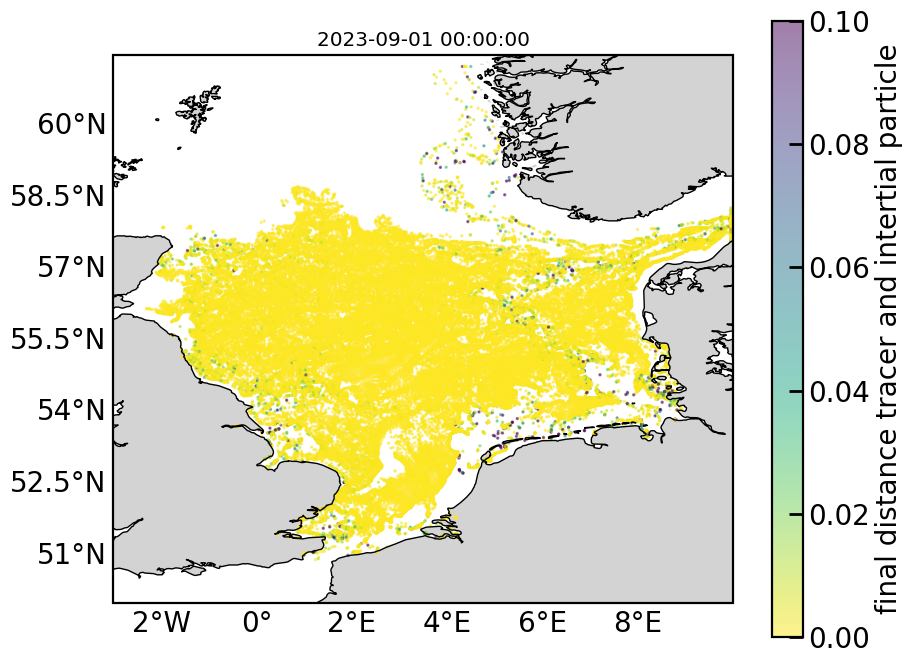

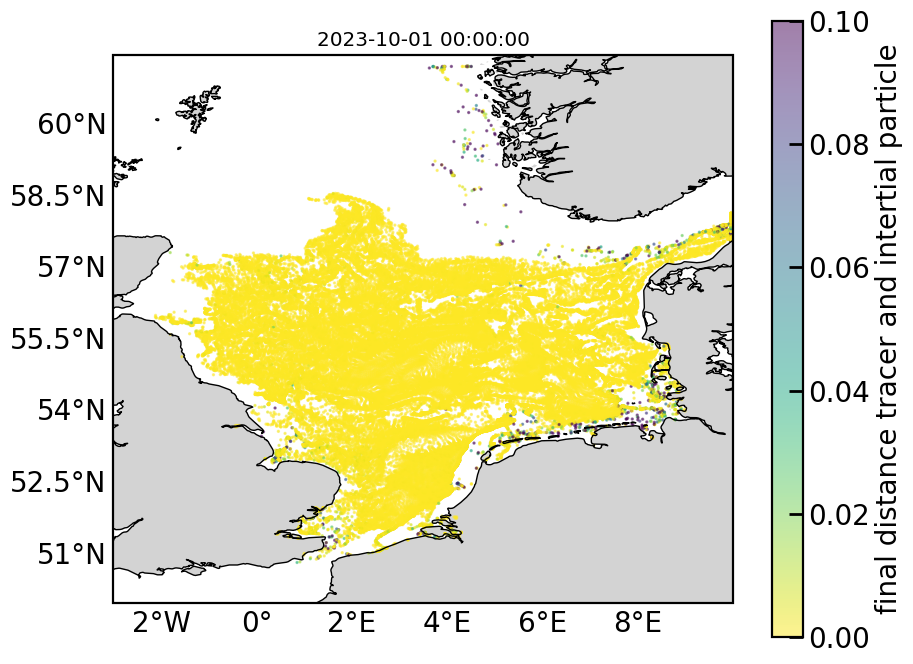

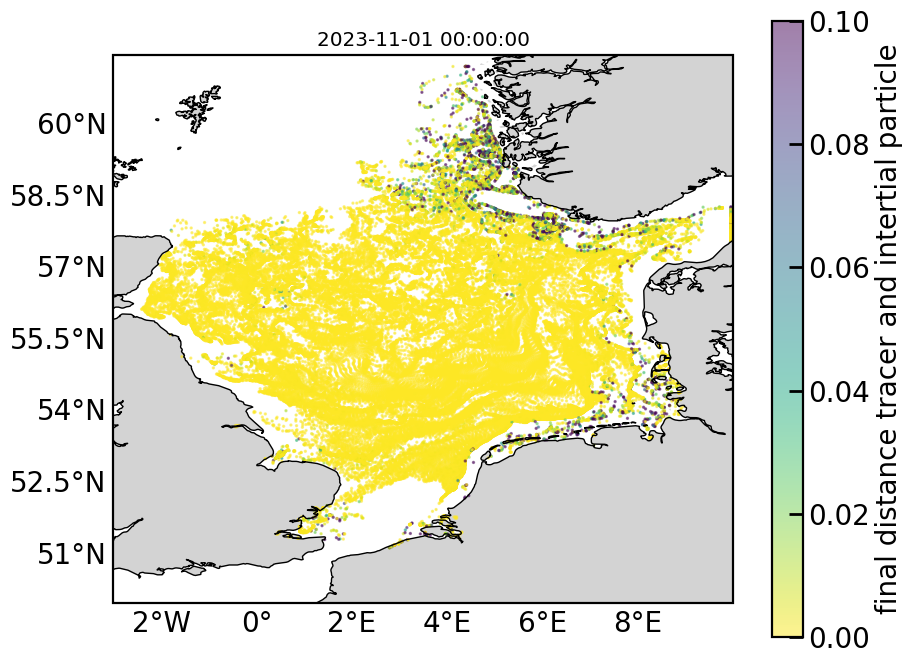

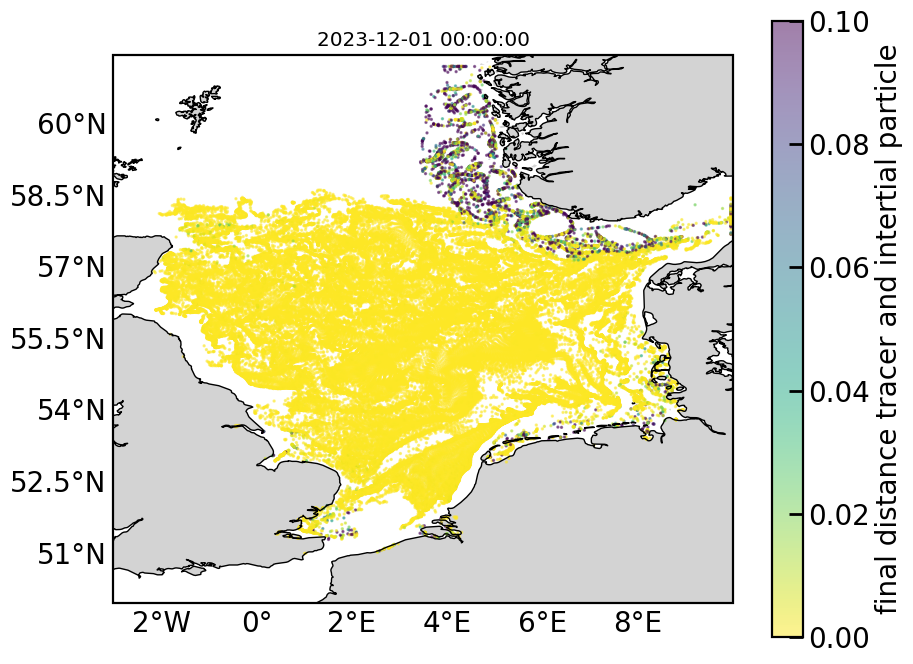

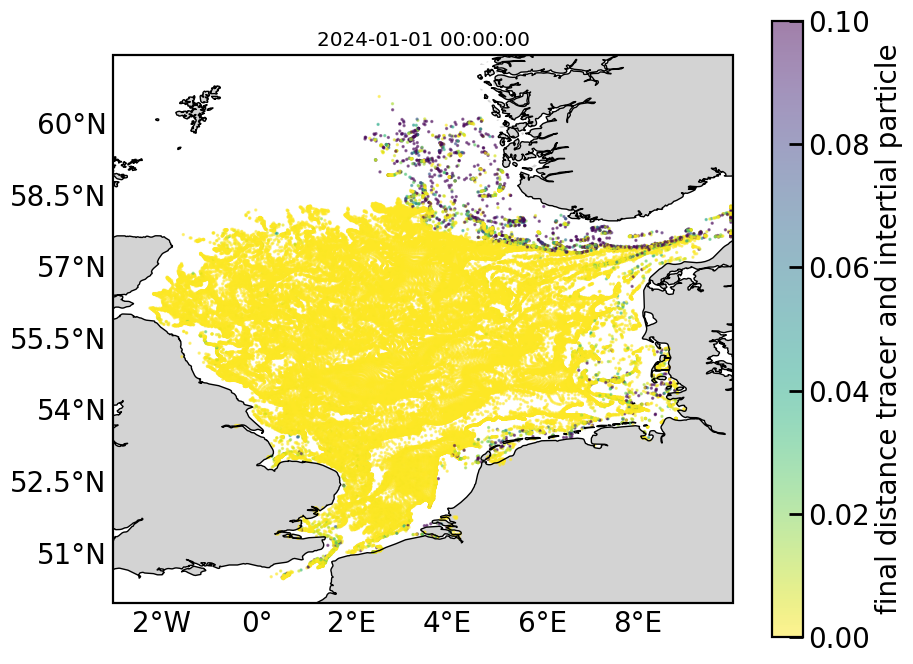

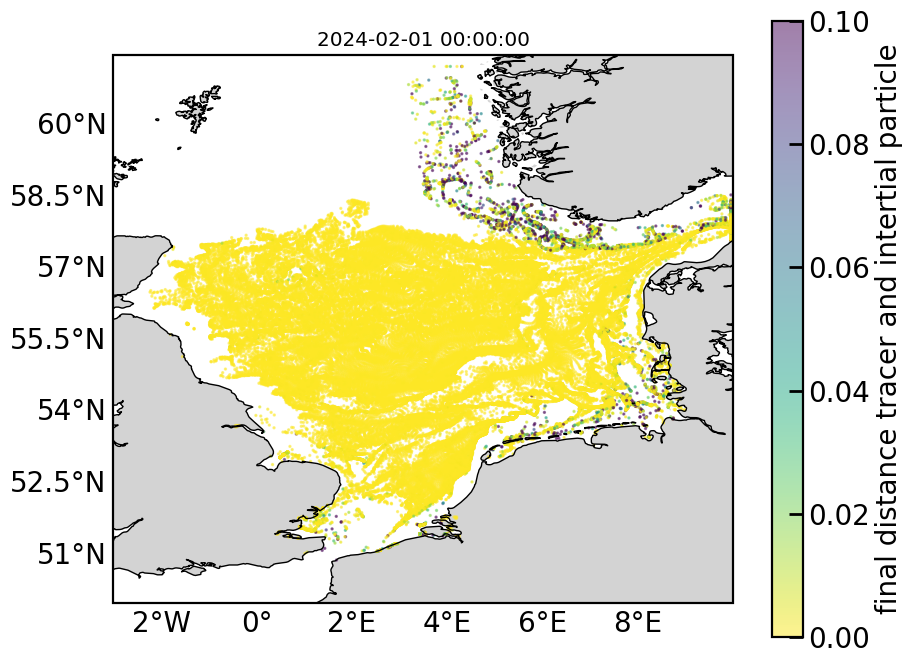

In [27]:
# plot trajectories particles when it is for the first time > cmax 

cmax = 1 #1 # 0.1 # km
i=0
tselect = 400

for starttime in starttimes:
    fig,ax = plt.subplots(subplot_kw={'projection':ccrs.PlateCarree()})
    print(starttime)
    year = starttime.year
    month = starttime.month
    
    # make dataset where only values where difference bigger than cmax are saved
    rate_dist = data[year][month].dist_tracer_MR.diff(dim='obs',n=1)[:,:tselect].ffill(dim='obs')[:,-1]
    final_lon = data[year][month].lon_tracer[:,:tselect].ffill(dim='obs')[:,-1]
    final_lat = data[year][month].lat_tracer[:,:tselect].ffill(dim='obs')[:,-1]

    
   
    #use bfill to plot first nonnan value
    sc=ax.scatter(final_lon, final_lat,s=2,c=np.fabs(rate_dist),alpha=0.5,cmap='viridis_r',vmin=0,vmax=0.1)
    cxbar=fig.colorbar(sc,label='final distance tracer and intertial particle')




    i+=1
    ax.coastlines()
    ax.add_feature(cart.feature.LAND,facecolor='lightgrey')

    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                    linewidth=0, color='gray', alpha=0.5, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 20}
    gl.ylabel_style =  {'size': 20}


    ax.set_xlim(-3,10)
    ax.set_ylim(50,61.5)
    ax.set_title(starttime)

In [86]:
data[year][month].dist_tracer_MR[:,-1].shape

(68476,)

fraction (dist > 0.01 km) = 0.4996
fraction (dist > 0.1 km) = 0.1326
fraction (dist > 1.0 km) = 0.0566
fraction (dist > 10.0 km) = 0.0272
fraction (dist > 100.0 km) = 0.0055


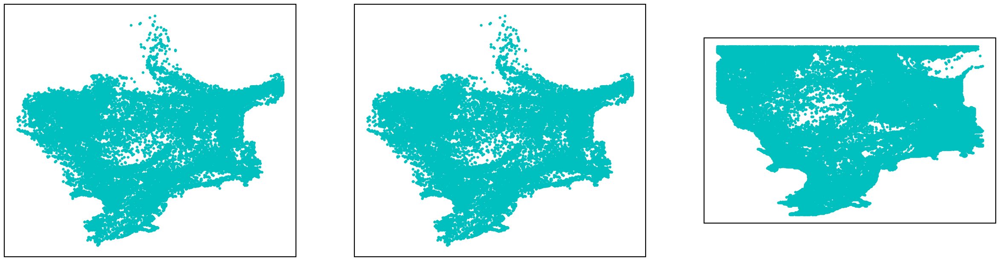

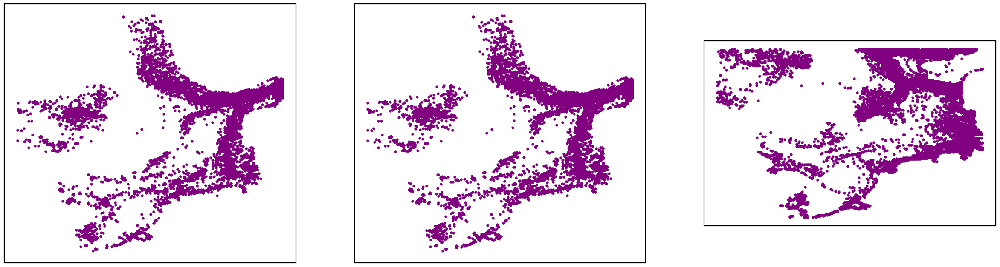

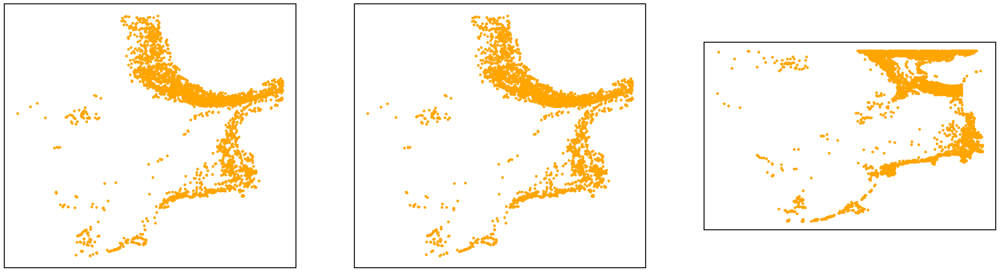

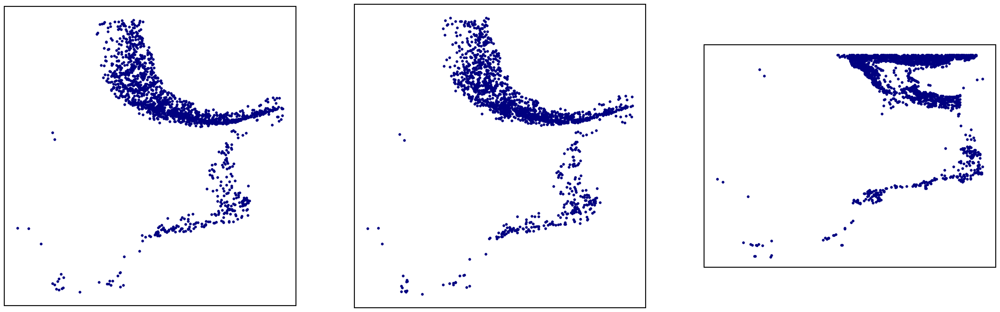

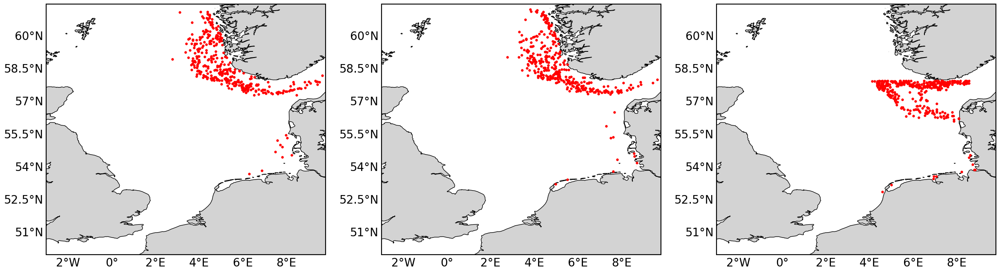

In [91]:
# plot trajectories particles when it is for the first time > cmax for specific month 

cmaxlist=np.array([0.01,0.1,1.0,10,100])
i=0
fig,axs=plt.subplots(1,3,figsize=(30,10),subplot_kw={'projection':ccrs.PlateCarree()})
j=2
startime= starttimes[4]
year = starttime.year
month = starttime.month
for cmax in cmaxlist:


    # make dataset where onlly values where difference bigger than cmax are saved
    ds_cmax = data[year][month].where(data[year][month].dist_tracer_MR > cmax)

    first_lon = ds_cmax.lon_tracer.bfill(dim='obs')[:,0]
    first_lat = ds_cmax.lat_tracer.bfill(dim='obs')[:,0]
    first_lon_MR = ds_cmax.lon_MR.bfill(dim='obs')[:,0]
    first_lat_MR = ds_cmax.lat_MR.bfill(dim='obs')[:,0]
    #use bfill to plot first nonnan value
    axs[0].plot(first_lon, first_lat,'.',color=colorlist[i])
    axs[1].plot(first_lon_MR, first_lat_MR,'.',color=colorlist[i])
    select=~np.isnan(first_lon.values)  
    index_select = np.arange(0,nparticles,1)[select]

    start_lon = data[year][month].lon_tracer[select,0]
    start_lat = data[year][month].lat_tracer[select,0]
    axs[2].plot(start_lon,start_lat,'.',color=colorlist[i])



    ntotal=ds_cmax.lon_tracer.bfill(dim='obs')[:,0].dropna('trajectory').shape[0]
    print(f'fraction (dist > {cmax} km) = {ntotal/nparticles:.04f}')
    i+=1
for p in range(0,3,1):
    axs[p].coastlines()
    axs[p].add_feature(cart.feature.LAND,facecolor='lightgrey')

    gl = axs[p].gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                    linewidth=0, color='gray', alpha=0.5, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 20}
    gl.ylabel_style =  {'size': 20}
    axs[p].set_xlim(-3,9.8)
    axs[p].set_ylim(50,61.5)


# axs[1].set_xlim(-3,9.8)
# axs[1].set_ylim(50,61.5)


Text(0.5, 1.0, 'Distribution of times when difference is for the first time > 1 km ')

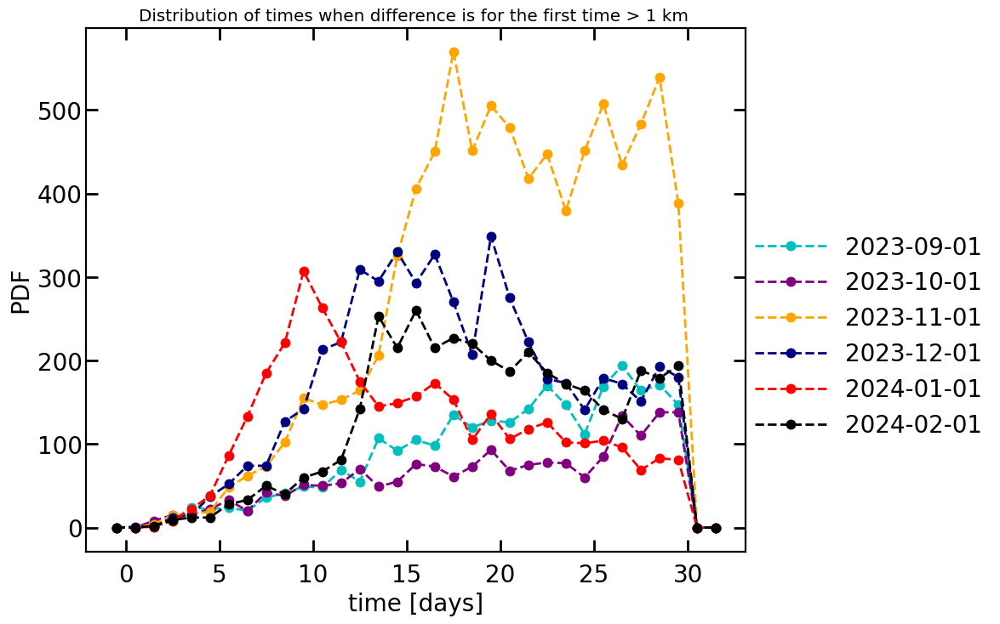

In [41]:
# trajectoreis of particles that at some point diviate more than cmax km 
cmax = 1 # km
i=0
fig,ax=plt.subplots()
# fig,axs=plt.subplots(1,2,figsize=(20,10),subplot_kw={'projection':ccrs.PlateCarree()})
for starttime in starttimes:
    year = starttime.year
    month = starttime.month
        
    # make dataset where onlly values where difference bigger than cmax are saved
    ds_cmax = data[year][month].where(data[year][month].dist_tracer_MR > cmax)
    nspersecond=10**9
    first_time = ds_cmax.time_tracer.bfill(dim='obs')[:,0].values
    first_time = first_time[~np.isnan(first_time)]

    bins,pdf = make_PDF(first_time/3600/24,30,norm=False,min=0,max=30)
    ax.plot(bins,pdf,'--o',color=colorlist[i])
    i+=1
ax.legend(legend,loc=(1,0.2))

ax.set_xlabel('time [days]')
ax.set_ylabel('PDF')
ax.set_title('Distribution of times when difference is for the first time > 1 km ')


### When and where particles start to separate exactly?
Below I plot single tracectories of particles that start to separate more than 1km

15744


Text(0, 0.5, 'Distance between tracer and MR particle [km]')

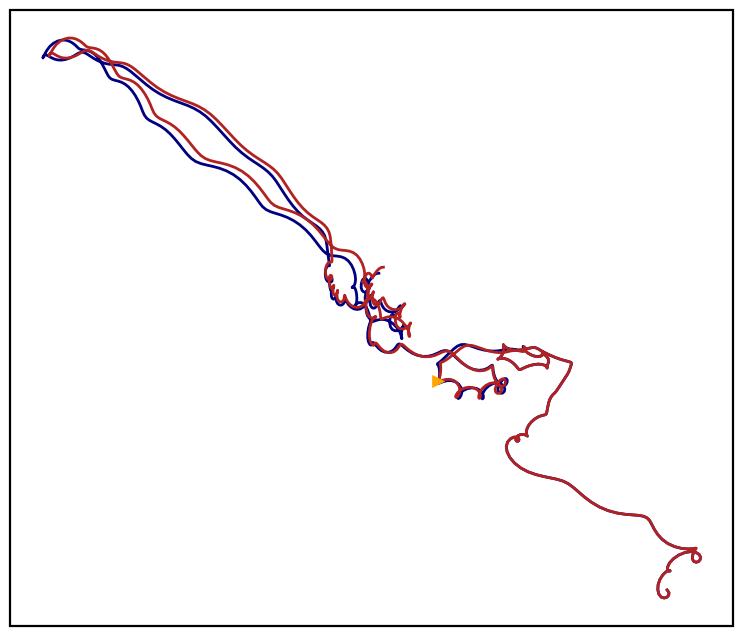

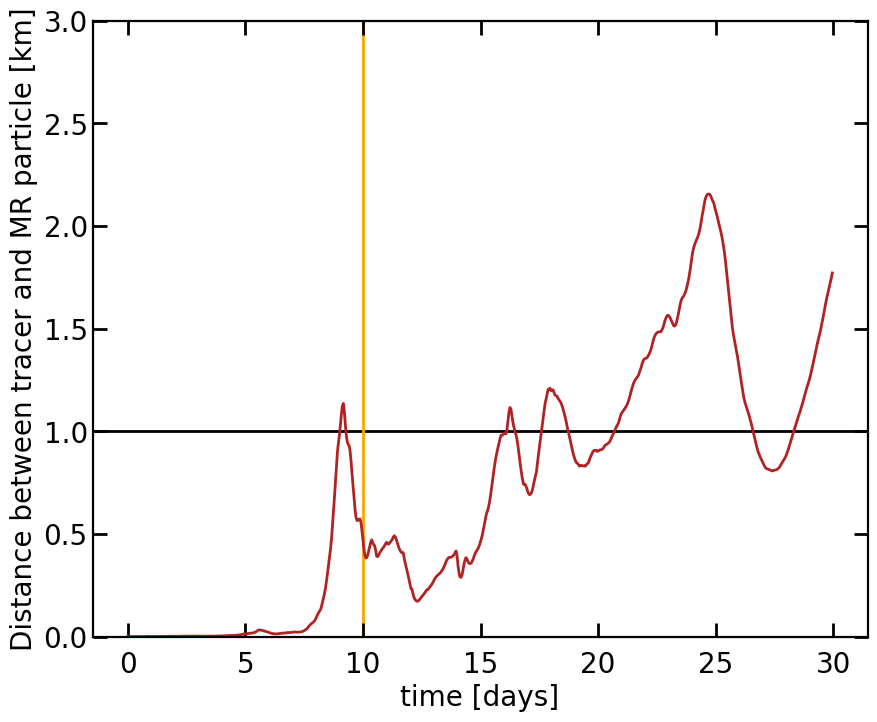

In [13]:
# trajectories of particles that at some point diviate more than 1 km 
i = 2 #november
starttime = starttimes[i]
year = starttime.year
month = starttime.month
cmax = 0.1 #km

#fig,ax=plt.subplots()
fig,ax=plt.subplots(subplot_kw={'projection':ccrs.PlateCarree()})


ds_cmax = data[year][month].where(data[year][month].dist_tracer_MR > cmax)

#use bfill to plot first nonnan value
first_lon = ds_cmax.lon_tracer.bfill(dim='obs')[:,0]
first_lat = ds_cmax.lat_tracer.bfill(dim='obs')[:,0]
select=~np.isnan(first_lon.values)  

index_select = np.arange(0,nparticles,1)[select]
print(index_select.size)

lon_tracer_select = data[year][month].lon_tracer.isel(trajectory=index_select)
lat_tracer_select = data[year][month].lat_tracer.isel(trajectory=index_select)
traj_tracer_select = data[year][month].traj_tracer.isel(trajectory=index_select)
lon_MR_select = data[year][month].lon_MR.isel(trajectory=index_select)
lat_MR_select = data[year][month].lat_MR.isel(trajectory=index_select)
traj_MR_select = data[year][month].traj_MR.isel(trajectory=index_select)
traj_diff_select = data[year][month].traj_diff.isel(trajectory=index_select)
dist_select = data[year][month].dist_tracer_MR.isel(trajectory=index_select)

pid= -1500 #700

ax.plot(lon_tracer_select[pid,:].T,lat_tracer_select[pid,:].T,color='navy')
ax.plot(lon_MR_select[pid,:].T,lat_MR_select[pid,:].T,color='firebrick')
ax.plot(lon_MR_select[pid,240].T,lat_MR_select[pid,240].T,'>',color='orange')
# ax.plot(lon_MR_select[pid,380].T,lat_MR_select[pid,380].T,'s',color='c')
ax.coastlines()
ax.add_feature(cart.feature.LAND,facecolor='lightgrey')
# ax.set_xlim(-3,9.8)
# ax.set_ylim(50,61.5)

fig2,ax2=plt.subplots()


tlist=np.arange(0,720,1)
ax2.plot(tlist/24,dist_select[pid,:720],'-',color='firebrick')
ax2.axhline(1,color='black',zorder=-20)
ax2.axvline(240/24,color='orange',zorder=-10)
# ax2.axvline(390/24,color='c',zorder=-10)
ax2.set_ylim(0,3)
ax2.set_xlabel('time [days]')
ax2.set_ylabel('Distance between tracer and MR particle [km]')
# ax2.plot(tlist,dist_select[0,:700],'-',color='black')


start for loop
start for loop
start for loop
start for loop
start for loop
start for loop


Text(0, 0.5, 'ratio ')

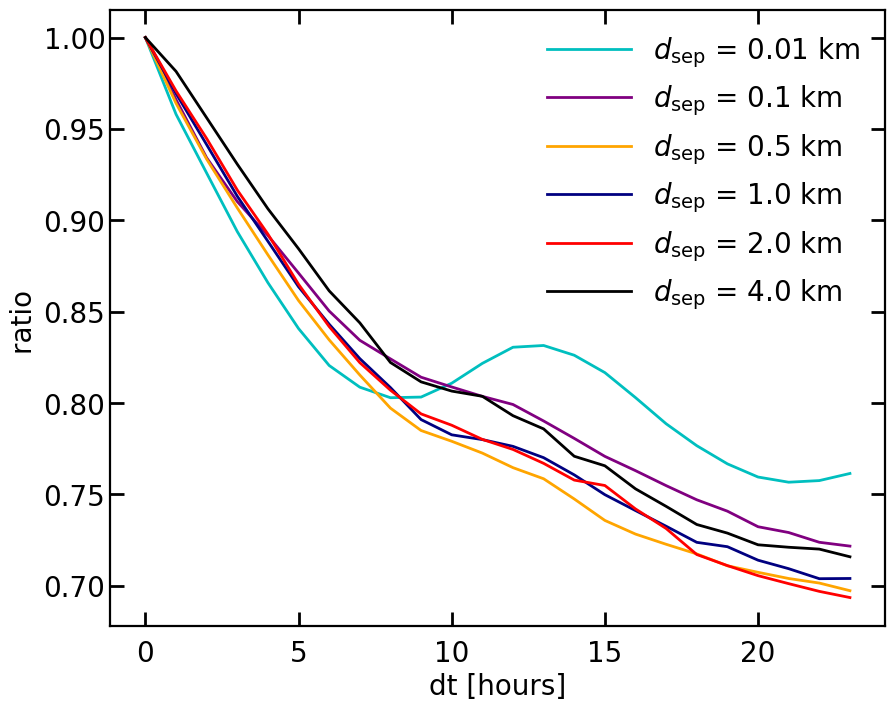

In [29]:
#n probability if dist is cmax at time t_cmax probability that after t_cmax + delta_t is > than cmax
# 1) make list of 
i = 2 #november
starttime = starttimes[i]
year = starttime.year
month = starttime.month
cmaxlist=np.array([0.01,0.1,0.5, 1.0, 2,4])
fig,ax=plt.subplots()
j=0
legend_cmax = []
dTmax = 24
for cmax in cmaxlist:
    legend_cmax.append('$d_{\\mathrm{sep}}$ = ' + f'{cmax} km')
    count = np.zeros(dTmax)
    grow = np.zeros(dTmax)
    ratio = np.zeros(dTmax)
 
    ratio[0]=1

    time_cmax = data[year][month].time_tracer.where(data[year][month].dist_tracer_MR > cmax)
    first_time = time_cmax.bfill(dim='obs')[:,0].values
    select=~np.isnan(first_time)  
    start_time = first_time[select]
    index_select = np.arange(0,nparticles,1)[select]
    nparticles_cmax = index_select.size
    count[0]=nparticles_cmax
    grow[0]=nparticles_cmax

    ds_cmax = data[year][month].dist_tracer_MR.isel(trajectory=index_select)

    array = ds_cmax.values
    print('start for loop')
    m = 0
    for dt in range(1,dTmax,1):
        for n in range(0,nparticles_cmax,1):
            tstart = int(start_time[n]/3600)+dt
            if(tstart < 800):
                value = array[n,tstart]
                if(value != np.nan):
                    count[dt]+=1
                    if(value >= cmax):
                        grow[dt]+=1



    # print(test[3])
    ratio = 1.0 * grow / (1.0 * count)
    
    ax.plot(ratio,color=colorlist[j])

    j+=1
ax.legend(legend_cmax)
# axs[2].set_yscale('log')
ax.set_xlabel('dt [hours]')
ax.set_ylabel('ratio ')






(0.0, 2.0)

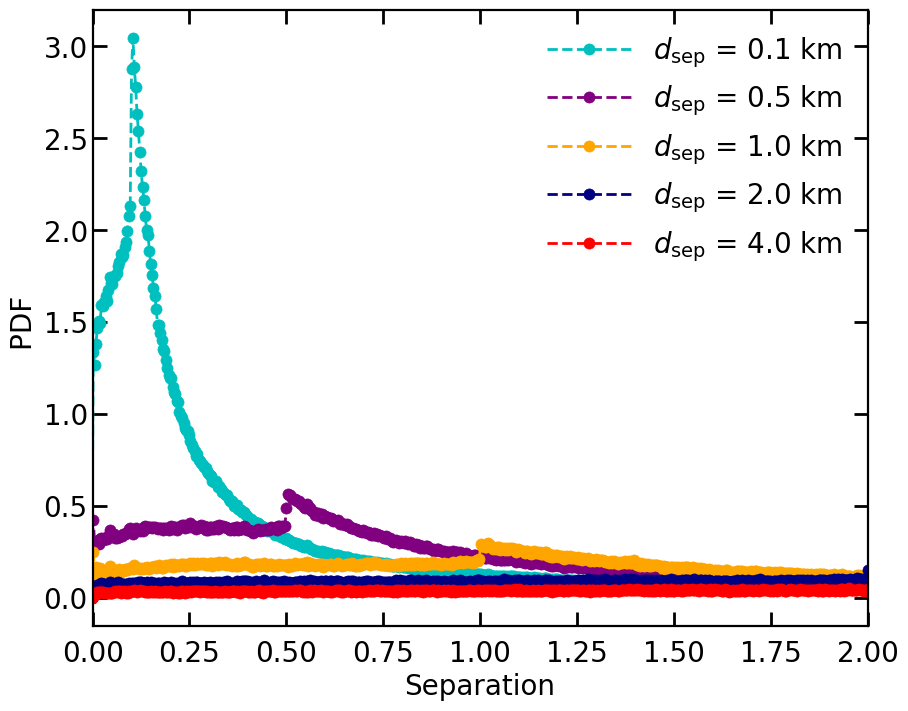

In [43]:
#n probability if dist is cmax at time t_cmax probability that after t_cmax + delta_t is > than cmax
# 1) make list of 
i = 2 #november
starttime = starttimes[i]
year = starttime.year
month = starttime.month
cmaxlist=np.array([0.1,0.5, 1.0, 2,4])
fig,ax=plt.subplots()
j=0
legend_cmax = []
dTmax = 24
for cmax in cmaxlist:
    legend_cmax.append('$d_{\\mathrm{sep}}$ = ' + f'{cmax} km')
    count = np.zeros(dTmax)
    grow = np.zeros(dTmax)
    ratio = np.zeros(dTmax)
 
    ratio[0]=1

    time_cmax = data[year][month].time_tracer.where(data[year][month].dist_tracer_MR > cmax)
    first_time = time_cmax.bfill(dim='obs')[:,0].values
    select=~np.isnan(first_time)  
    start_time = first_time[select]
    index_select = np.arange(0,nparticles,1)[select]
    nparticles_cmax = index_select.size
    ds_cmax = data[year][month].dist_tracer_MR.isel(trajectory=index_select)
    array = ds_cmax.values
    arr1=np.array(array[0,int(start_time[0]/3600):])
    arr1 = arr1[~np.isnan(arr1)]

    for n in range(1,nparticles_cmax):
        arr2=np.array(array[n,int(start_time[n]/3600):])
        arr2 = arr2[~np.isnan(arr2)]
        arr1 = np.concatenate((arr1,arr2))

    

    X, PDF = make_PDF(arr1,100000,True)

    ax.plot(X,PDF,'--o',color=colorlist[j])
    j+=1
    
ax.legend(legend_cmax)
# axs[2].set_yscale('log')
ax.set_xlabel('Separation')
ax.set_ylabel('PDF ')
ax.set_xlim(0,2)






It seems that for specific months (November/December 2023) the effect of inertia is significant  
However if we select the particles for which the difference is significant (> 1km) we see that  
this are almost all coastal particles. Which suggests that this is an effect of the boundary  
conditions and not so much of the intertia of the particles.  
  
Below we select a fraction of the particles away from the boundary and see that the along  
track distance is the same for these particles.  

update (13 sept): If we look at the eulerian fields the biggest values of Du/Dt live at the  
coast, so it might not be the boundary condition but an actual feature! It would be good to  
test this for a different dataset that lives on a c-grid so there is no antibeaching current.   
However then we need to think about the derivatives at the coast still. We have the following options:  
1. calculate the derivative using the values at the boundaries of the gridcell (not sure how to implement)  
2. set derivatives in gridcell for coast to zero  


In [ ]:
# along track displacement for selection region 
fig,axs = plt.subplots(1,3,figsize=(30,10))
i=0
legend=[]
for starttime in starttimes:
    print(starttime)
    year = starttime.year
    month = starttime.month
    legend.append(f'{year}-{month:02d}-01')
    
    traj_tracer=trajectory_length(datatracer[year][month]['data']['lon'].values[select,:],datatracer[year][month]['data']['lon'].values[select,:])
    traj_MRSM=trajectory_length(dataMRSM[year][month]['data']['lon'].values[select,:],dataMRSM[year][month]['data']['lon'].values[select,:])
   
    diff_traj = np.fabs(traj_tracer - traj_MRSM)
    tlist=np.arange(0,24*10,1)/24

    tracer_number=np.zeros(24*10)
    tracer_values=np.zeros(24*10)
    tracer_error=np.zeros(24*10)

    MRSM_number=np.zeros(24*10)
    MRSM_values=np.zeros(24*10)
    MRSM_error=np.zeros(24*10)

    diff_number=np.zeros(24*10)
    diff_values=np.zeros(24*10)
    diff_error=np.zeros(24*10)

    for t in range(0,24*10,1):
        tracer_array=traj_tracer[:,t][~np.isnan(traj_tracer[:,t])]
        tracer_values[t]=np.mean(tracer_array)
        tracer_number[t]=tracer_array.size
        tracer_error[t]=np.std(tracer_array)

        MRSM_array=traj_MRSM[:,t][~np.isnan(traj_MRSM[:,t])]
        MRSM_values[t]=np.mean(MRSM_array)
        MRSM_number[t]=MRSM_array.size
        MRSM_error[t]=np.std(MRSM_array)

        diff_array=diff_traj[:,t][~np.isnan(diff_traj[:,t])]
        diff_values[t]=np.mean(diff_array)
        diff_number[t]=diff_array.size
        diff_error[t]=np.std(diff_array)


    axs[0].errorbar(tlist[::24],tracer_values[::24],tracer_error[::24]/np.sqrt(tracer_number[::24]),fmt='--o',color=colorlist[i])
    axs[1].errorbar(tlist[::24],MRSM_values[::24],MRSM_error[::24]/np.sqrt(MRSM_number[::24]),fmt='--o',color=colorlist[i])
    axs[2].errorbar(tlist[::24],diff_values[::24],diff_error[::24]/np.sqrt(diff_number[::24]),fmt='--o',color=colorlist[i])
    i+=1

axs[0].set_xlabel('time [days]')
axs[1].set_xlabel('time [days]')
axs[2].set_xlabel('time [days]')

axs[0].set_ylabel('Along track displacement tracer particles [km]')
axs[1].set_ylabel('Along track displacement inertial particles [km]')
axs[2].set_ylabel('diffrence inertial and tracer particles[km]')
# axs[0].text(0,1000,'(a)',fontsize=30)
# axs[1].text(0,1000,'(b)',fontsize=30)
# axs[2].text(0,5,'(c)',fontsize=30)
axs[2].legend(legend,loc=(0.1,0.4))
# axs[2].set_yscale('log')
# axs[2].set_xscale('log')
#  print(trajectories[1000,-1])
# traj_length_mean=np.mean(trajectories,axis=0)
# traj_length_sd=np.std(trajectories,axis=0)

# fig,ax=plt.
# 
# subplots()
# i=0
# tlist=np.arange(0,traj_length_mean.size,1)
# ax.errorbar(tlist,traj_length_mean,traj_length_sd,fmt='--o',color='navy')
# ax.legend(starttimes)

# # #ax.set_title(season+' '+year,fontsize=20)
# ax.set_ylabel('Along track displacement [km]')

(68476,)
(68476,)
(68476,)
(68476,)
(68476,)
(68476,)


(0.0, 0.02)

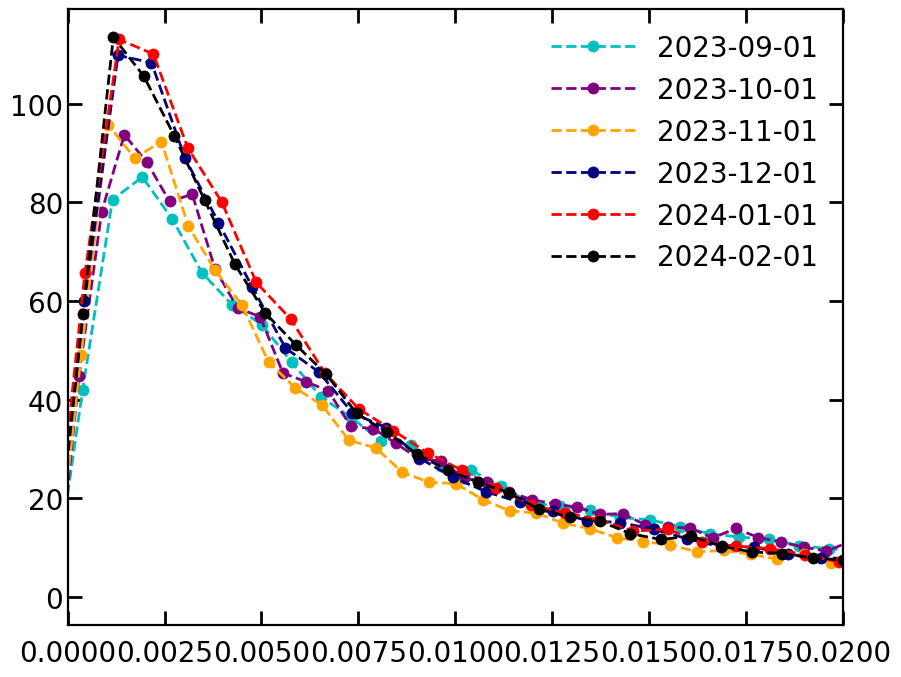

In [7]:
# make pdf, log-normal distirbution? 
# for good statistics I think you should only compare 1 timestep and not all timesteps
# TO DO: make a pdf that does logaritmic scaling
i=0
fig,ax=plt.subplots()
legend=[]
for starttime in starttimes:

    year = starttime.year
    month = starttime.month
    legend.append(f'{year}-{month:02d}-01')

    array = data[year][month]['dist_tracer_MR'][:,700].values
    print(array.shape)
    array = array[~np.isnan(array)]

    X, PDF = make_PDF(array,500000,True)

    ax.plot(X[0:],PDF[0:],'--o',color=colorlist[i])
        
    i+=1
ax.legend(legend)
# ax.set_xscale('log')
xtest=np.logspace(-3,2,100)
# ax.plot(xtest[0:],np.exp(-(xtest[:]/0.005)**(1)),'-',color='green')
# ax.set_xlim(0.2,0.4)
# ax.set_ylim(0,1)
ax.set_xlim(0,0.02)

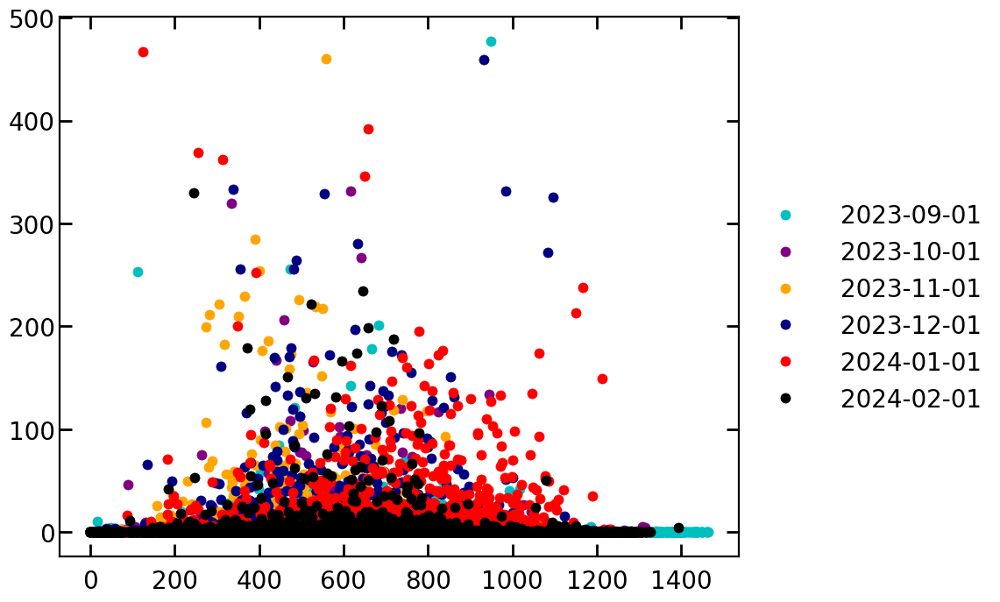

In [9]:
# make pdf
i=0
fig,ax=plt.subplots()
legend=[]
for starttime in starttimes:

    year = starttime.year
    month = starttime.month
    legend.append(f'{year}-{month:02d}-01')

    ax.plot(dataMRSM[year][month]['traj'][:,300],dataMRSM[year][month]['diff_traj'][:,300],'o',color=colorlist[i])

    i+=1
ax.legend(legend,loc=(1,0.25))


In [13]:
np.mean(dataMRSM[year][month]['diff_traj'][:,200][~np.isnan(dataMRSM[year][month]['diff_traj'][:,200])])

0.04044389

In [ ]:
# make better plots at some point, also consider to analyse only doggersbank particles
i=0
starttime=starttimes[i]
print(starttime)
year = starttime.year
month = starttime.month
values=[]
tmaxlist=[]
b = (~np.isnan(dataMRSM[year][month]['diff_traj'])).cumsum(1).argmax(1)

c=dataMRSM[year][month]['diff_traj'][ np.arange(dataMRSM[year][month]['diff_traj'].shape[0]),b]
fig,ax=plt.subplots()
lon = dataMRSM[year][month]['data']['lon'][:,0].values[select]#[~np.isnan(dataMRSM[year][month]['data']['lon'][0].values)]
lat = dataMRSM[year][month]['data']['lat'][:,0].values[select]


plot = ax.scatter(lon,lat,s=10, c = c, norm=colors.LogNorm())
fig.colorbar(plot)
    


In [ ]:
# make animation of trajectories of particles that deviate more than 1 km 

i = 3
starttime=starttimes[i]
year = starttime.year
month = starttime.month
values=[]
tmaxlist=[]
b = (~np.isnan(dataMRSM[year][month]['diff_traj'])).cumsum(1).argmax(1)

c=dataMRSM[year][month]['diff_traj'][ np.arange(dataMRSM[year][month]['diff_traj'].shape[0]),b]
fig,ax=plt.subplots()
lon = dataMRSM[year][month]['data']['lon'][select,0].values[c>1]#[~np.isnan(dataMRSM[year][month]['data']['lon'][0].values)]
lat = dataMRSM[year][month]['data']['lat'][select,0].values[c>1]


plot = ax.scatter(lon,lat,s=100, c = c[c>1], norm=colors.LogNorm())
fig.colorbar(plot)
    

In [ ]:
if(np.nan > 5):
    print('true')
else:
    print('false')

In [ ]:

# make better plots at some point, also consider to analyse only doggersbank particles
i=2
starttime=starttimes[i]
print(starttime)
year = starttime.year
month = starttime.month
values=[]
tmaxlist=[]
array=dataMRSM[year][month]['diff_traj'][:,700]
b = (~np.isnan(dataMRSM[year][month]['diff_traj'])).cumsum(1).argmax(1)

c=dataMRSM[year][month]['diff_traj'][ np.arange(dataMRSM[year][month]['diff_traj'].shape[0]),b]
lon = dataMRSM[year][month]['data']['lon'][:,0].values[~np.isnan(array)]
lat = dataMRSM[year][month]['data']['lat'][:,0].values[~np.isnan(array)]
lontracer=datatracer[year][month]['data']['lon'][c<0.1,:]
lattracer=datatracer[year][month]['data']['lat'][c<0.1,:]

lonMRSM=dataMRSM[year][month]['data']['lon'][c<0.1,:]
latMRSM=dataMRSM[year][month]['data']['lat'][c<0.1,:]

fig,ax=plt.subplots(subplot_kw={'projection':ccrs.PlateCarree()})
ax.coastlines()
ax.add_feature(cart.feature.LAND,facecolor='lightgrey')
tmax=699
ax.plot(lontracer[::1,:tmax+1:1].T, lattracer[::1, :tmax+1:1].T, color='black')
ax.plot(lontracer[::1,0].T, lattracer[::1,0].T, '>', color='green',zorder=20)
ax.plot(lonMRSM[::1, :tmax+1:1].T, latMRSM[::1, :tmax+1:1].T,':', color='grey')


# array= array[~np.isnan(array)]





# plot = ax.scatter(lon[array>5],lat[array>5],s=1, c = array[array>5], norm=colors.LogNorm())
# fig.colorbar(plot)
    
